# COS60013 Data Science with Python
### Assignment 2, Adam Thomas

### Build machine learning models to inform business decisions

### Scenario

ServiceFirst is a successful organisation and business is steady. However, many employees resigned after the pandemic. The high staff turnover led to high recruitment costs and a loss of in-house experience. The Executive leadership team asked the P&C team to survey all employees to establish areas of employee satisfaction and dissatisfaction. Their premise is that if employees are happier, they may stay with the organisation.

The P&C team launched a survey to establish how employees perceive the organisation’s climate. The P&C team have completed the initial analysis of the survey and explored the output from the initial explorations and linear regression you completed in **Assignment 1**. 

Now, they have asked you to apply advanced analytics techniques and ML algorithms to help them to try and make connections between specific aspects of the survey results and how these impact how people feel about working at ServiceFirst. They would like to try and predict which factors may have the most impact on employee satisfaction so that they can work on increasing this. 

They have provided a data set which contains the standardised scores for 50 questions that target the key areas of interest. In addition, they have provided textual responses to the question, **‘What led to how you feel about working at ServiceFirst? Describe an event at work and how it affected your thoughts and feelings.’** The P&C team would like you to perform sentiment analysis on the raw text data from the survey to derive further insights into how employees feel about the organisation.

142 of the 196 respondents permitted their data to be used in the P&C research project. The P&C team have provided:

- demographic data describing work location (remote or office-based).
- length of service and managerial status.
- a standardised score for 10 specific areas of interest. The higher the score, the higher the satisfaction in that area.
- an overall score, which is a total of the 10 standardised scores. The higher the score, the more satisfied the employee in general.
- an intention to quit score. 
- sentiment analysis codes.

The areas the P&C team have chosen to focus on are as follows. The relevant data column name is in brackets after each focal area.

* How involved people feel in the organisational decisions and changes that affect their jobs. `(involved)`
* How trusted people feel by the organisation. `(autonomy)`
* How people feel about their direct managers. `(direct_manag)`
* How strongly people feel about their teams. `(integrated)`
* Whether people feel that the organisation values their well-being. `(welfare)`
* Whether people feel they get enough training to perform their jobs well. `(training)`
* Whether there is a good work-life balance. `(work_press)`
* Whether people perceive that the organisation responds well to externally driven change. `(reflexive)`
* Whether people perceive that the organisation welcomes ideas for innovation and implements these ideas. `(innovative)`
* Whether people perceive that the organisation responds well to customer needs. `(customers)`


__Problem statement__: What are the key drivers for employee satisfaction?

Questions that may help to formulate the hypothesis are:

- Which of the focal areas have the highest and lowest satisfaction scores?
- Which of the focal areas have the most effect on the overall score?
- What steps can the organisation take to try and improve employee satisfaction?

### Project outline

In order to meet the objectives set by the P&C team:
* try and predict which factors may have the most impact on employee satisfaction
* apply advanced analytics techniques and ML algorithms to help them to try and make connections between specific aspects of the survey results and how these impact how people feel about working at ServiceFirst, and
* perform sentiment analysis on the raw text data from the survey to derive further insights into how employees feel about the organisation.

We will investigate three common ML models:
* k-means clustering
* classification decision tree
* sentiment analysis with NLP


### Regression, classification or clustering

In Assignment 1 we investigated regression models to predict employee satisfaction. In this assignment our focus shifts to clustering and classification models to glean insights from the employee survey responses. K-means is a clustering model that partitions the dataset into k clusters based on similarity, whereas classification decision tree and sentiment analysis are models designed to assign class labels to data according to predefined rules. 

### Supervised or unsupervised

Clustering is usually used on unlabelled data to form natural groups within the data. However, when clustering forms part of predictive analysis, k-means can be employed with labeled data to train the model for assigning unseen data to clusters. This approach, known as semi-supervised learning, utilizes labeled data alongside clustering algorithms.

Decision trees recursively split the dataset into subsets based on the values of the input features, aiming to minimize __impurity__ at each split. This process is guided by the labeled training data, where the correct class labels are known for each record. Once trained, the decision tree can predict the class lables of new data records by traversing the tree from the root node to a leaf node, following the decision rules learned during training.

Sentiment analysis can be both supervised and unsupervised learning, depending on the approach. Our approach in this investigation is unsupervised, utilising lists of words with associated sentiment scores to infer the sentiment of the employee comments without explicit labels.

# k-means clustering

### predict the areas that contribute to overall satisfaction

### Import, explore and prepare the data

In [1]:
# k-means clustering using employee_survey.csv

# import the necessary libraries
import pandas as pd
import numpy as np

# import the dataset and save as a DataFrame
df = pd.read_csv('employee_survey.csv')

# view the DataFrame
df.head()

,id,agree,workloc,workleng,manag_resp,involved,autonomy,direct_manag,integrated,welfare,training,work_press,reflexive,innovative,customers,overall_score,intent_quit,sentiment
0,1,Yes,2,3,2,3.195169,3.879956,1.343400,4.920832,2.623486,4.476097,3.903101,2.996662,-2.256064,2.736050,27.82,2,3
1,2,Yes,1,3,2,-1.017589,0.613432,1.053927,-0.147223,1.073410,-1.106388,-0.705966,2.004760,-1.880934,-1.645745,-1.76,2,1
2,8,Yes,1,3,2,1.510066,0.613432,-2.419751,0.486283,0.040025,-0.308890,1.598567,-1.466898,0.744976,2.370901,3.17,2,3
3,15,Yes,1,3,2,1.088790,-0.475410,-1.551332,-0.780730,-1.510051,-1.106388,-0.129833,-1.218922,1.120106,-0.550296,-5.11,2,1
4,20,Yes,2,3,2,-0.596313,-1.564251,-0.393439,-0.147223,0.040025,0.488608,-0.129833,0.268931,0.744976,-1.280595,-2.57,3,3


In [2]:
# display a summary of the DataFrame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 18 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             142 non-null    int64  
 1   agree          142 non-null    object 
 2   workloc        142 non-null    int64  
 3   workleng       142 non-null    int64  
 4   manag_resp     142 non-null    int64  
 5   involved       142 non-null    float64
 6   autonomy       142 non-null    float64
 7   direct_manag   142 non-null    float64
 8   integrated     142 non-null    float64
 9   welfare        142 non-null    float64
 10  training       142 non-null    float64
 11  work_press     142 non-null    float64
 12  reflexive      142 non-null    float64
 13  innovative     142 non-null    float64
 14  customers      142 non-null    float64
 15  overall_score  142 non-null    float64
 16  intent_quit    142 non-null    int64  
 17  sentiment      142 non-null    int64  
dtypes: float64

* The DataFrame consists of 142 rows and 18 columns.
* The `agree` column has data type string, all other columns are numeric.
* There are no missing values.

### Determine if there are duplicate rows

In [3]:
# Identify duplicate rows.
df[df.duplicated()]

,id,agree,workloc,workleng,manag_resp,involved,autonomy,direct_manag,integrated,welfare,training,work_press,reflexive,innovative,customers,overall_score,intent_quit,sentiment


Great, there are no duplicate values in the dataset.

### Drop unnecessary columns
`id` and `agree` are not needed for the analysis.

In [4]:
# drop columns 'id' and 'agree'
results = df.drop(columns = ['id', 'agree'])

# display a summary of the numeric variables and column names
print(results.shape)
results.info()

(142, 16)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 142 entries, 0 to 141
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   workloc        142 non-null    int64  
 1   workleng       142 non-null    int64  
 2   manag_resp     142 non-null    int64  
 3   involved       142 non-null    float64
 4   autonomy       142 non-null    float64
 5   direct_manag   142 non-null    float64
 6   integrated     142 non-null    float64
 7   welfare        142 non-null    float64
 8   training       142 non-null    float64
 9   work_press     142 non-null    float64
 10  reflexive      142 non-null    float64
 11  innovative     142 non-null    float64
 12  customers      142 non-null    float64
 13  overall_score  142 non-null    float64
 14  intent_quit    142 non-null    int64  
 15  sentiment      142 non-null    int64  
dtypes: float64(11), int64(5)
memory usage: 17.9 KB


### Confirm that there are no missing values

In [5]:
results.isnull().sum()

workloc          0
workleng         0
manag_resp       0
involved         0
autonomy         0
direct_manag     0
integrated       0
welfare          0
training         0
work_press       0
reflexive        0
innovative       0
customers        0
overall_score    0
intent_quit      0
sentiment        0
dtype: int64

Fantastic! We have a balanced dataset.

The column names make sense in this dataset, there is no need to rename any of the columns.

### Compute descriptive statistics
Explore the dataset.

In [5]:
# Descriptive statistics.
results.describe().round()

,workloc,workleng,manag_resp,involved,autonomy,direct_manag,integrated,welfare,training,work_press,reflexive,innovative,customers,overall_score,intent_quit,sentiment
count,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0,142.0
mean,2.0,10.0,2.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,0.0,-0.0,-0.0,2.0,2.0
std,0.0,5.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,4.0,1.0,1.0
min,1.0,3.0,1.0,-4.0,-3.0,-3.0,-3.0,-3.0,-3.0,-4.0,-1.0,-3.0,-3.0,-12.0,1.0,1.0
25%,1.0,8.0,1.0,-1.0,-0.0,-1.0,-1.0,-0.0,-0.0,-1.0,-1.0,-1.0,-1.0,-2.0,1.0,1.0
50%,2.0,8.0,2.0,0.0,0.0,-0.0,-0.0,0.0,-0.0,0.0,0.0,-0.0,0.0,-0.0,2.0,2.0
75%,2.0,13.0,2.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,2.0,2.0,2.0
max,2.0,23.0,2.0,3.0,4.0,1.0,5.0,3.0,4.0,4.0,3.0,1.0,3.0,28.0,3.0,3.0


The scores for the focus areas of the survey have been standardised, meaning that they range from -5 to 5, producing a mean value of 0 with a standard deviation of 1.0, as displayed in the summary above.

Let's explore the distrubtion of the responses:

array([[<Axes: title={'center': 'workloc'}>,
        <Axes: title={'center': 'workleng'}>,
        <Axes: title={'center': 'manag_resp'}>,
        <Axes: title={'center': 'involved'}>],
       [<Axes: title={'center': 'autonomy'}>,
        <Axes: title={'center': 'direct_manag'}>,
        <Axes: title={'center': 'integrated'}>,
        <Axes: title={'center': 'welfare'}>],
       [<Axes: title={'center': 'training'}>,
        <Axes: title={'center': 'work_press'}>,
        <Axes: title={'center': 'reflexive'}>,
        <Axes: title={'center': 'innovative'}>],
       [<Axes: title={'center': 'customers'}>,
        <Axes: title={'center': 'overall_score'}>,
        <Axes: title={'center': 'intent_quit'}>,
        <Axes: title={'center': 'sentiment'}>]], dtype=object)

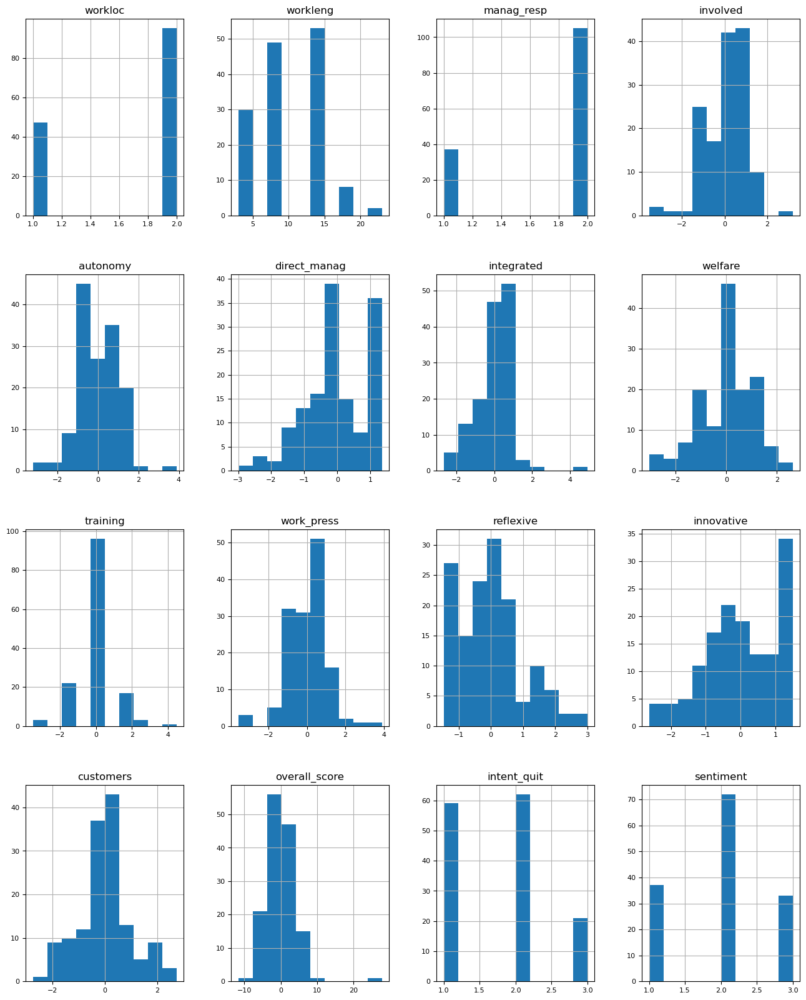

In [5]:
#Visualisation:
# Import Matplotlib and Seaborn.
import matplotlib.pyplot as plt
import seaborn as sns

# Create a histogram.
results.hist(figsize=(16, 20),
        xlabelsize=8,
        ylabelsize=8)

We see a mixture of categorical and continuous variables displayed in the histograms above. It is interesting to note the numbers for intention to quit and intention to stay are close in value but the sentiment is overwhelmingly negative, given that value of two represents negative sentiment.

There is an outlier present in the overall score distribution, we will remove this record from the dataset.

For the k-means clustering we will use the 10 key focus areas as input variables with the aim of building a cluster model to predict overall score. A couple of questions appear to separate managers from their reports. I expect that the clusters may relate to managerial status.

### remove the outlier

In [6]:
# remove the outlier from the 'overall_score' column, creating a new DataFrame to preserve the original.
results2 = results.drop(0)

# display the new DataFrame summary statistics
results2.describe()

,workloc,workleng,manag_resp,involved,autonomy,direct_manag,integrated,welfare,training,work_press,reflexive,innovative,customers,overall_score,intent_quit,sentiment
count,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000,141.000000
mean,1.666667,9.631206,1.737589,-0.022661,-0.027517,-0.009528,-0.034900,-0.018606,-0.031745,-0.027682,-0.021253,0.016000,-0.019405,-0.197801,1.730496,1.964539
std,0.473085,4.570732,0.441513,0.966283,0.948078,0.997076,0.912664,0.978587,0.928987,0.947394,0.970848,0.985154,0.976367,3.442590,0.705888,0.701135
min,1.000000,3.000000,1.000000,-3.545243,-3.197513,-2.998698,-2.681251,-3.060127,-3.498881,-3.586633,-1.466898,-2.631194,-2.741193,-11.680000,1.000000,1.000000
25%,1.000000,8.000000,1.000000,-0.596313,-0.475410,-0.682912,-0.780730,-0.476667,-0.308890,-0.705966,-0.722971,-0.755544,-0.550296,-2.520000,1.000000,1.000000
50%,2.000000,8.000000,2.000000,-0.175037,0.069011,-0.103966,-0.147223,0.040025,-0.308890,-0.129833,0.020956,-0.005284,0.180003,-0.280000,2.000000,2.000000
75%,2.000000,13.000000,2.000000,0.667514,0.613432,0.764454,0.486283,0.556717,0.488608,0.446301,0.516907,0.744976,0.545153,2.440000,2.000000,2.000000
max,2.000000,23.000000,2.000000,1.510066,2.246694,1.343400,2.386804,2.623486,2.881101,2.750834,2.996662,1.495236,2.370901,10.400000,3.000000,3.000000


We see that the mean and standard deviation for the 10 key focus areas have changed from 0 and 1.0 to slightly different numbers.

## Scaling the data

k-means clustering is a distance-based algorith, using distances between data points to determine their similarity. Before employing a distance-based algorith it is important to scale the data so that all features contribute equally to the result.
If one feature varies less than another because of their scales the algorithm may make incorrect inferences.
As the survey scores have been presented in standardised form there is no need to scale the dataset in this case.

## Visualise the data

### a) create a pairplot

Let's start with a pairplot to determine the spread of the data (histograms) and possible correlations/relationships (scatterplots) between the columns.

C:\Users\adamt\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


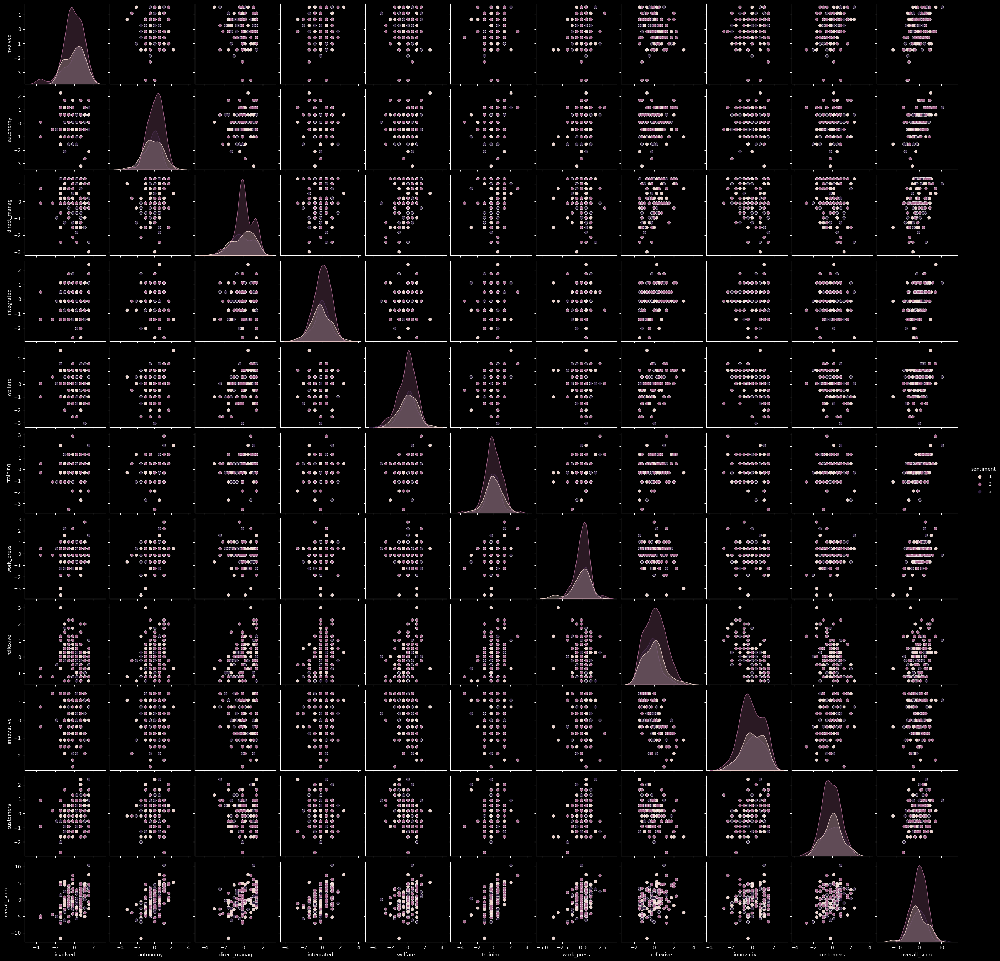

In [7]:
# Create a pairplot with Seaborn.
import seaborn as sns
import matplotlib.pyplot as plt

# set plot style to have dark background
plt.style.use('dark_background')


# Help to view Seaborn plots inside Jupyter Notebook.
%matplotlib inline

# Specify x variable.
variables_for_pairplot = results2[['involved', 'autonomy', 'direct_manag', 'integrated', 'welfare', 'training', 'work_press', 
             'reflexive', 'innovative', 'customers', 'overall_score']]

# Create the pairplot using 'sentiment' to color the data points.
sns.pairplot(results2, 
             vars=variables_for_pairplot,
             hue='sentiment')

C:\Users\adamt\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


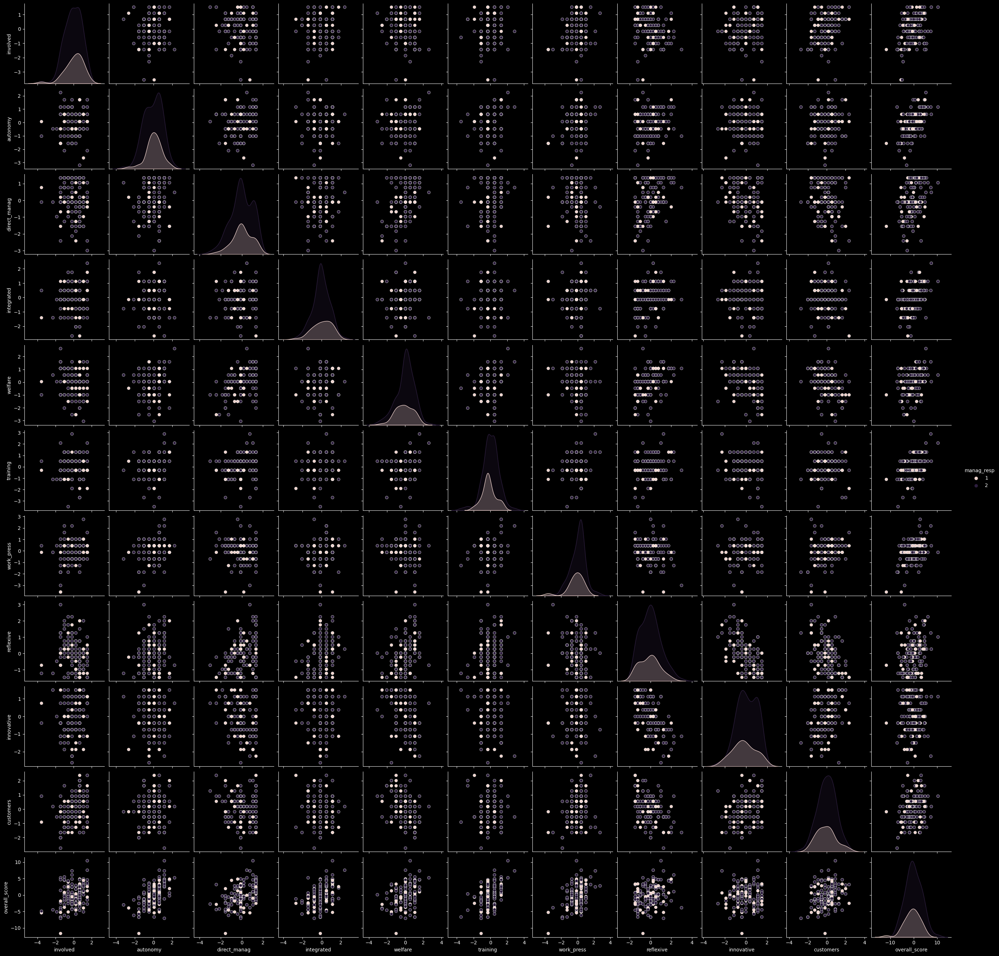

In [8]:
# Create the pairplot using 'managerial status' to hue the plots.
sns.pairplot(results2, 
             vars=variables_for_pairplot,
             hue='manag_resp',
             diag_kind='kde')

Based on the above two pairplots, the first with hue set to colour by sentiment (3 groups) and the second set by 'managerial responsibility (2 groups) there does not appear to be any neat, separate clusters upon visual inspection of the overall score row.

Let's investigate whether the k-means clustering algorithm can find some natural groups for us.

## Determine the k-value

### a) elbow method

Text(0, 0.5, 'Elbow')

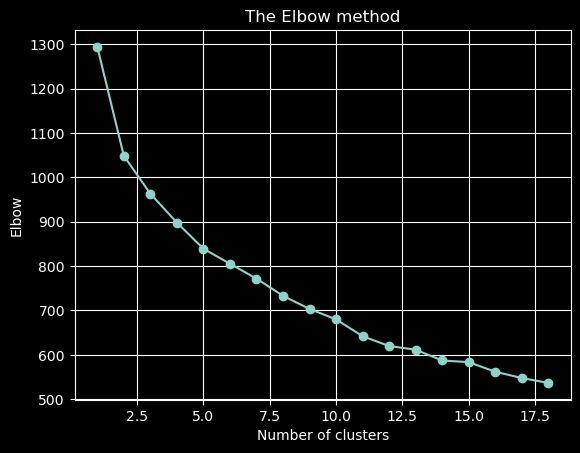

In [31]:
# Import the KMeans class.
from sklearn.cluster import KMeans 

# Extract features for clustering
X = results2[['involved', 'autonomy', 'direct_manag', 'integrated', 'welfare', 'training', 'work_press', 'reflexive', 'innovative', 'customers']]

import warnings
warnings.filterwarnings('ignore')

# Elbow chart for us to decide on the number of optimal clusters.
# Default of max_iter=300 and n_init=10.
elbow = []
for i in range(1, 19):
    kmeans = KMeans(n_clusters=i,
                    init='k-means++',
                    max_iter=300,
                    n_init=10,
                    random_state=0)
    kmeans.fit(X)
    elbow.append(kmeans.inertia_)

# Plot the elbow method.
plt.plot(range(1, 19),
         elbow,
         marker='o')

# Add a grid
plt.grid(True)

# Insert labels and title.
plt.title("The Elbow method")
plt.xlabel("Number of clusters")
plt.ylabel("Elbow")

The SSE (Sum of Squared Errors) decreases as the number of clusters increases, reflecting how well the data points are grouped around their centroid. The 'sweet spot' that we're looking for is where the line starts to bend, indicating an elbow. Although it is not clearly visible, it could be either 2, 3, 4, or 5. We can play around with the number of clusters (k) when evaluating and visualising the model. We know there are three groups based on employee intention to quit (those that intend to quit, those that do not intend to quit, and those that are not sure). However, there are many reasons, other than dissatisaction that can cause an employee to want to leave an organisation, such as relocating for family reasons. I think sentiment is a more accurate indicator of satisfaction with the organisation.

Let's explore ways of determining the optimal number of clusters and see if we can find model parameters that create meaningful clusters.

In [30]:
# We can make use of a Python library called `kneed` to find the elbow point in the curve:

from kneed import KneeLocator

kl = KneeLocator(range(1, 19), elbow, curve="convex", direction="decreasing")

kl.elbow

# This code is used to find the elbow point in the curve to assist in finding the optimal number of clusters.

5

The KneeLocator function has calculated the optimal number of clusters as 5, identifying the bend in the elbow curve.

The silhouette method measures cluster cohesion and separation. The silhouette coefficient values range between -1 and 1. Therefore, larger numbers indicate a better fit to a specific cluster. Let's look at the silhouette scores for our model.

### b) Silhouette method

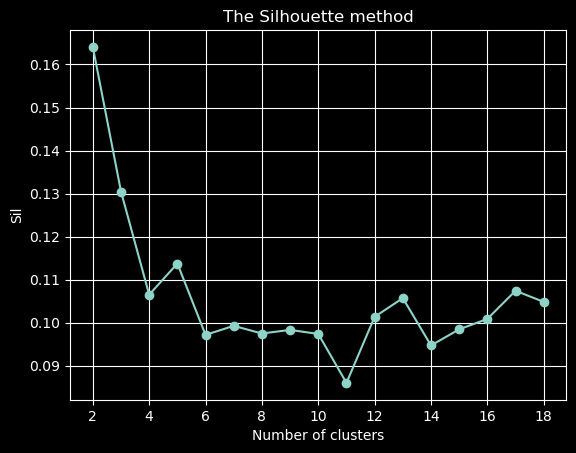

In [33]:
# Import silhouette_score class from sklearn.
from sklearn.metrics import silhouette_score

# Find the range of clusters to be used with the silhouette method.
sil = []
kmax = 18

for k in range(2, kmax+1):
    kmeans_s = KMeans(n_clusters=k).fit(X)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(X,
                                labels,
                                metric='euclidean'))

# Plot the silhouette method.
plt.plot(range(2, kmax+1),
         sil,
         marker='o')

# Add a grid
plt.grid(True)

# Insert labels and title.
plt.title("The Silhouette method")
plt.xlabel("Number of clusters")
plt.ylabel("Sil")

plt.show()

By calculating silhouette scores for different numbers of clusters and plotting them, you can visually assess the consistency and quality of clustering across different cluster numbers. The silhouette method complements the elbow method by providing a quantitative measure of cluster quality. The silhouette scores were calculated for a range of cluster numbers (2 to 18), and the resulting plot, shown above, suggests that the silhouette scores for 2, 3, 4 and 5 clusters are noteworthy. This indicates that our dataset could be grouped into 2, 3, 4, or 5 distinct clusters with reasonable separation between them. Ultimately, the selection of the final number of clusters should consider both the metrics used above and domain knowledge, ensuring that the resulting clusters are meaningful and provide actionable insights to address the business objectives.

Let's explore the k-means clustering model for the other values of k indicated above.

# Evaluate and visualise clusters

The elbow method suggested `k=5`, which corresponds to the number of groupings for length of employment. However, the silhouette method suggests that k could be 2, 3, 4 or 5. We'll continue to build the k-means clustering algorithm, fit it to the data set, and then evaluate goodness of fit. Let's investigate the `k`-values:

## `k=2`

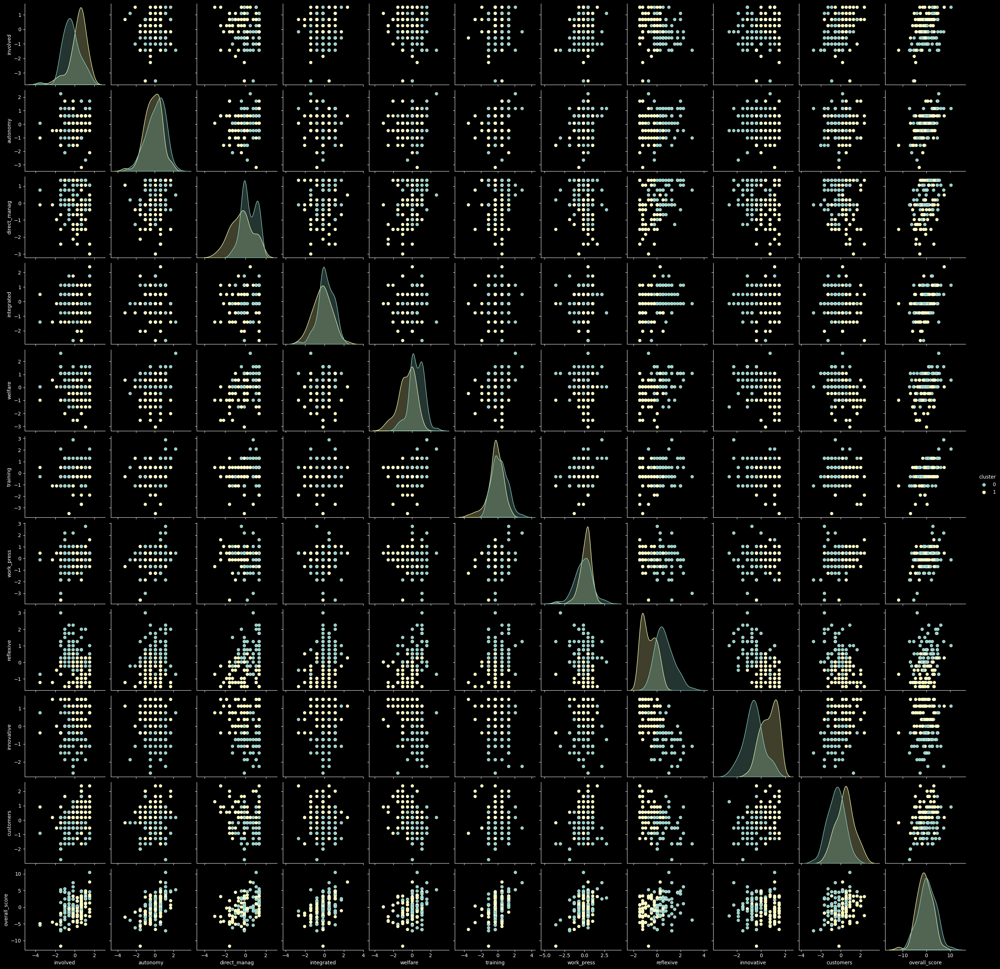

In [35]:
# Use two clusters:
kmeans = KMeans(n_clusters = 2,
                max_iter = 300,
                init='k-means++',
                random_state=0).fit(X)

results2['cluster'] = kmeans.labels_

# Plot the clusters.
sns.pairplot(results2,
             vars = variables_for_pairplot,
             hue='cluster',
             diag_kind= 'kde')

Based on on the pairplot, we can deduce the following:
* The scatterplots above show considerable overlapping of the two clusters. These clusters are soft clusters.

There does not appear to be any meaningful clustering in terms of understanding overall employee satisfaction.  Let's check using boxplots:

<Axes: xlabel='cluster', ylabel='overall_score'>

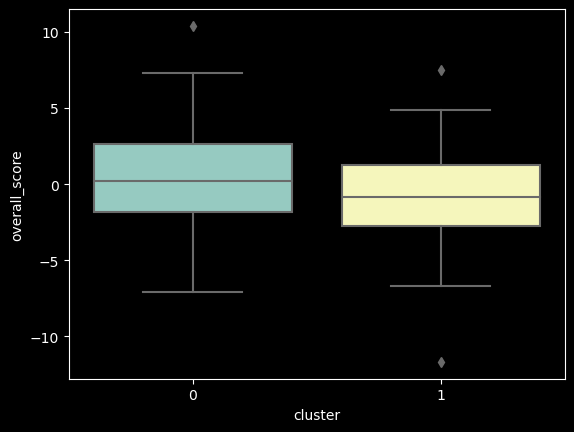

In [36]:
sns.boxplot(x='cluster', y='overall_score', data=results2)

As suspected, there is considerable overlap between the two clusters for overall employee satisfaction. To see if we can understand how the clusters were formed, let's consider the demographic groupings that lead to two groups, work location (office-based or remote) and managerial responsibilty, and compare the numbers of records belonging to each group. This will allow us to evaluate the goodness of fit of the k-means clustering algorithm.

In [20]:
# Compute the number of respondents per work location (remote or office-based)
results2['workloc'].value_counts()
# 1 = office-based
# 2 = remote

workloc
2    94
1    47
Name: count, dtype: int64

In [21]:
# Compute the number of respondents per managerial responsibility (a manager or not)
results2['manag_resp'].value_counts()
# 1 = manager
# 2 = not manager

manag_resp
2    104
1     37
Name: count, dtype: int64

In [37]:
# Check the number of observations per cluster
results2['cluster'].value_counts()

cluster
0    71
1    70
Name: count, dtype: int64

The clustering formed with two clusters does not appear to be meaningful in terms of addressing the business objective of understanding employee satisfaction. The cluster sizes do not match any of the demographic grouping, and there is insufficient partitioning in overall satisfaction scores.

## `k=3`

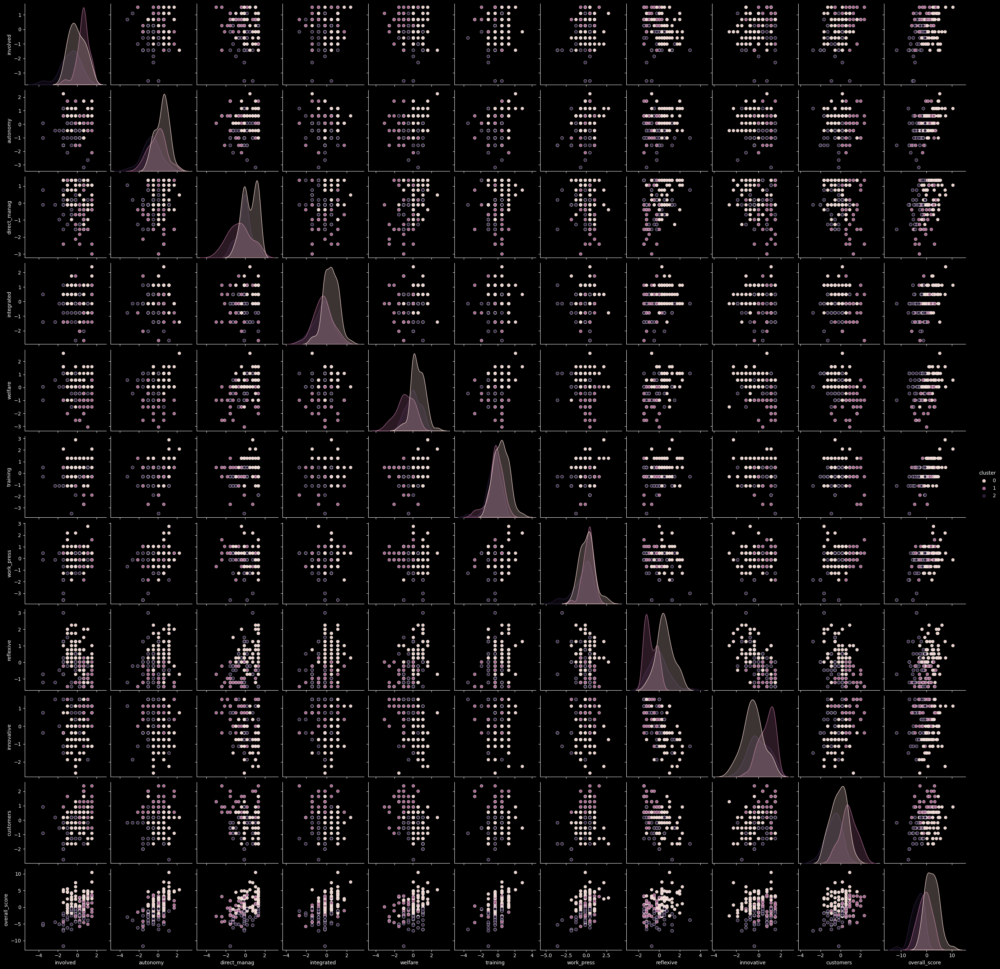

In [38]:
# Use three clusters.
kmeans = KMeans(n_clusters = 3,
                max_iter = 300,
                init = 'k-means++',
                random_state=0).fit(X)

results2['cluster'] = kmeans.labels_

# Plot the clusters.
sns.pairplot(results2,
             vars = variables_for_pairplot,
             hue='cluster',
             diag_kind= 'kde')

<Axes: xlabel='cluster', ylabel='overall_score'>

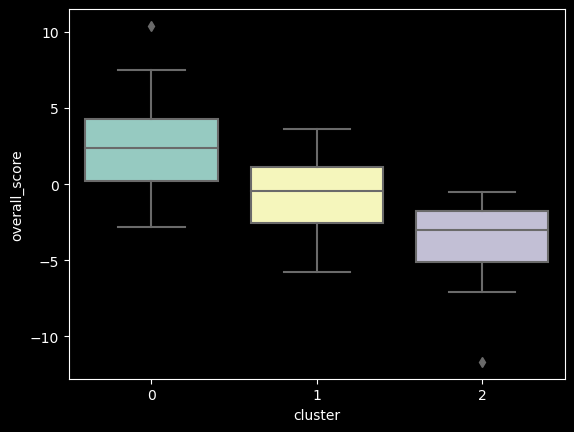

In [39]:
sns.boxplot(x='cluster', y='overall_score', data=results2)

We have seen the above plots earlier in the k-means investigation, where we initially chose the number of clusters as three to take a quick look at the model. Now, let's see how the number of records in the clusters matches to demographic areas that have three groupings.

In [40]:
# Display the number of records belonging to each group of "intent_quit"
results2['intent_quit'].value_counts()
# 1 = intend to quit (expect to have the lowest average overall satisfaction)
# 2 = intend to stay (expect to have the highest average overall satisfaction)
# 3 = not sure

intent_quit
2    61
1    59
3    21
Name: count, dtype: int64

In [41]:
# Display the number of records belonging to each group of "sentiment"
results2['sentiment'].value_counts()
# 1 = positive (expect to have the highest average overall satisfaction)
# 2 = negative (expect to have the lowest average overall satisfaction)
# 3 = neutral

sentiment
2    72
1    37
3    32
Name: count, dtype: int64

In [43]:
# Display the number of records belonging to each cluster
results2['cluster'].value_counts()
# 0 = (the highest average overall satisfaction)
# 1 = in between highest and lowest
# 2 = (the lowest average overall satisfaction)

cluster
0    61
1    43
2    37
Name: count, dtype: int64

The numbers do not match exactly for each of the grouping options, however, there are some noteworthy points. 
* Cluster 0 has the highest average overall score, which I'd expect to correlate with employees that intend to stay or those that have a positive sentiment towards the organisation. Cluster 0 has 61 members, as does the "intend to stay" group from `intent_quit` (which I'd expect to return the highest average overall satisfaction score). As mentioned above, there are many reasons an employee might leave an organisation, making it difficult to predict. However, it appears that the data may contain insights about employees that do not intend to quit in the near future.

## `k=4`

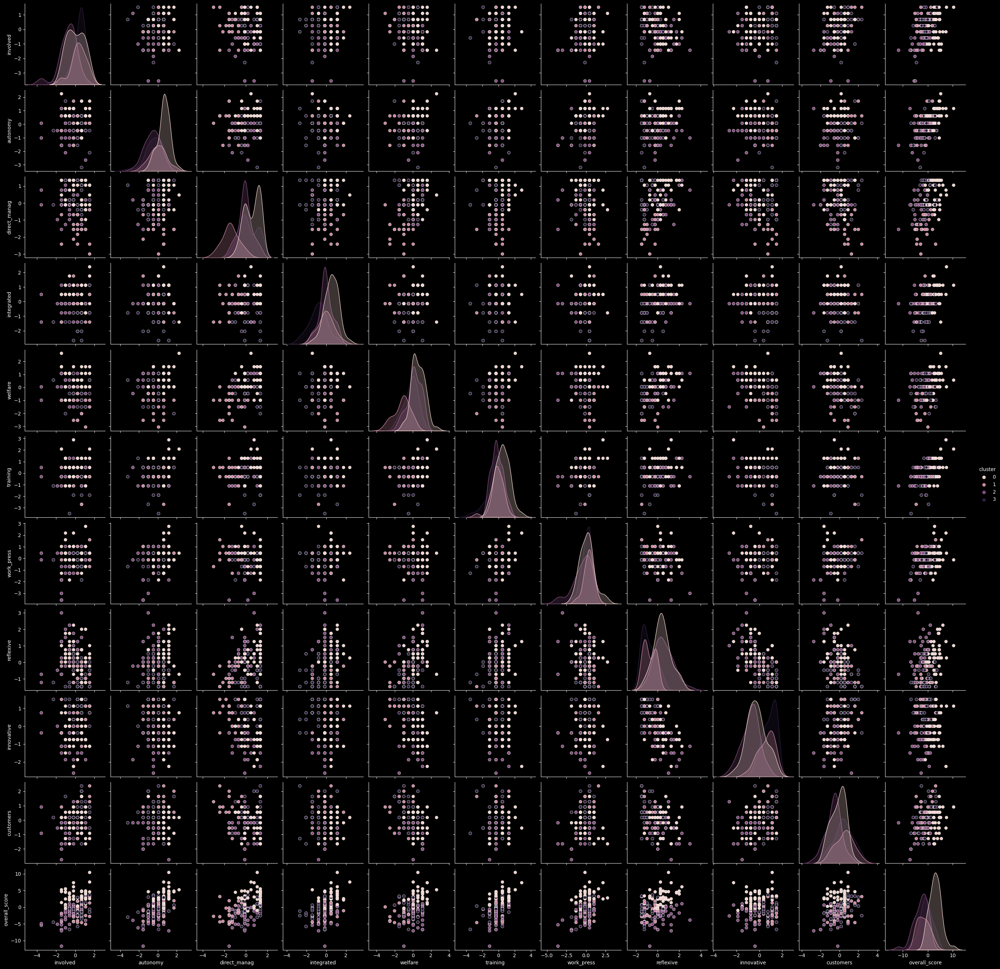

In [44]:
# Use four clusters.
kmeans = KMeans(n_clusters = 4,
                max_iter = 300,
                init = 'k-means++',
                random_state=0).fit(X)

results2['cluster'] = kmeans.labels_

# Plot the clusters.
sns.pairplot(results2,
             vars = variables_for_pairplot,
             hue='cluster',
             diag_kind= 'kde')

Upon visual inspection of the clustering in the scatterplots above, in particular along the `overall_score` row, there is considerable overlap of the clusters indicating that the clustering formed with four clusters may not capture the variation in satisfaction levels among employees. Let's inspect the boxplots:

<Axes: xlabel='cluster', ylabel='overall_score'>

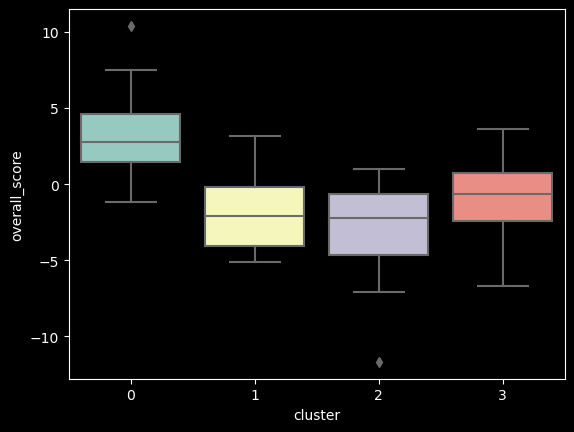

In [45]:
sns.boxplot(x='cluster', y='overall_score', data=results2)

There is considerable overlap in the distribution of overall score results of clusters 1, 2, and 3. This may suggest that the model is not effectively grouping employees based on satisfaction levels.

## `k=5`

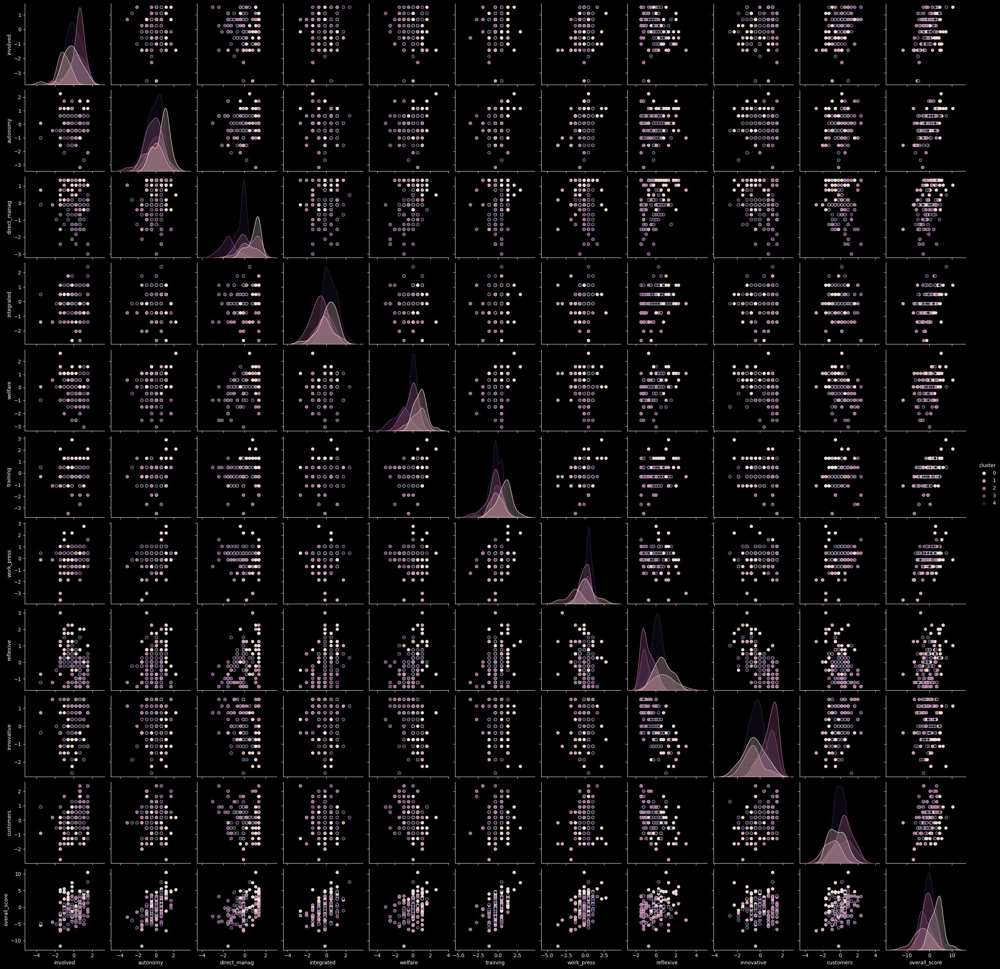

In [46]:
# Use five clusters.
kmeans = KMeans(n_clusters = 5,
                max_iter = 300,
                init = 'k-means++',
                random_state=0).fit(X)

results2['cluster'] = kmeans.labels_

# Plot the clusters.
sns.pairplot(results2,
             vars = variables_for_pairplot,
             hue='cluster',
             diag_kind= 'kde')

Again, there is considerable overlap between the clusters, suggesting that the clustering formed with five clusters does not adequately capture the variation in satisfaction levels among employees.

<Axes: xlabel='cluster', ylabel='overall_score'>

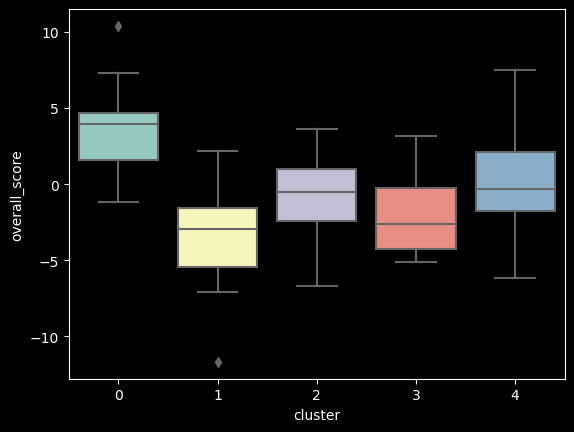

In [47]:
sns.boxplot(x='cluster', y='overall_score', data=results2)

There is considerable overlap in the distribution of overall score results of clusters 1, 2, 3, and 4. This may suggests that the model is not effectively grouping employees based on satisfaction levels.

### Optimal number of clusters

Given the analysis above the optimal number of clusters appears to be three, based on:
* Clearest separation of average overall satisfaction scores
* Goodness of fit to natural groupings of `intent_quit`, particularly intend to stay group size

Let's look at this more closely. How do we know what cluster relates to which grouping of `intent_quit`?

Let's run the code again to explore:

In [48]:
# set 3 clusters

kmeans = KMeans(n_clusters = 3,
                max_iter = 300,
                init = 'k-means++',
                random_state=0).fit(X)

results2['cluster'] = kmeans.labels_

In [49]:
# Check the number of observations per cluster.
results2['cluster'].value_counts()

cluster
0    61
1    43
2    37
Name: count, dtype: int64

In [50]:
results2['intent_quit'].value_counts()

intent_quit
2    61
1    59
3    21
Name: count, dtype: int64

In [51]:
results2['sentiment'].value_counts()

sentiment
2    72
1    37
3    32
Name: count, dtype: int64

In [52]:
# View the DataFrame to compare the groupings
results2[['intent_quit', 'sentiment', 'cluster']]

,intent_quit,sentiment,cluster
1,2,1,0
2,2,3,1
3,2,1,1
4,3,3,2
5,3,3,0
...,...,...,...
137,1,2,2
138,1,2,1
139,1,2,1
140,1,2,0


We see in the above DataFrame that the clusters consist of members from various groupings of both `intent_quit` and `sentiment`. Let's look at the combinations to determine the distribution of groupings into the clusters. This will assist us with evaluation of the goodness of fit of the k-means clustering model.

In [53]:
# Compute the number of members in each cluster that come from each of the 'intent_quit' groups:

combination_counts_intent = results2.groupby(['cluster', 'intent_quit']).size()

# Print the counts of each combination
print("Counts of combinations of 'cluster' and 'intent_quit':")
print(combination_counts_intent)

# 1 = intend to quit (expect to have the lowest average overall satisfaction)
# 2 = intend to stay (expect to have the highest average overall satisfaction)
# 3 = not sure

Counts of combinations of 'cluster' and 'intent_quit':
cluster  intent_quit
0        1              27
         2              25
         3               9
1        1              15
         2              20
         3               8
2        1              17
         2              16
         3               4
dtype: int64


From the output we see that each cluster consists of members fromeach of the 'intention to quit' categories:
- intention to quit
- intention to stay
- not sure

Cluster 0 had the highest average overall satisfaction score, so I'd expected that most members of this cluster would be drawn from those employees that intend to stay. However, 27 intend to quit, 25 intend to stay, and 9 are not sure. There are similar distributions in the other clusters also.

Let's look at this visually, to get a more intuitive feel for the data:

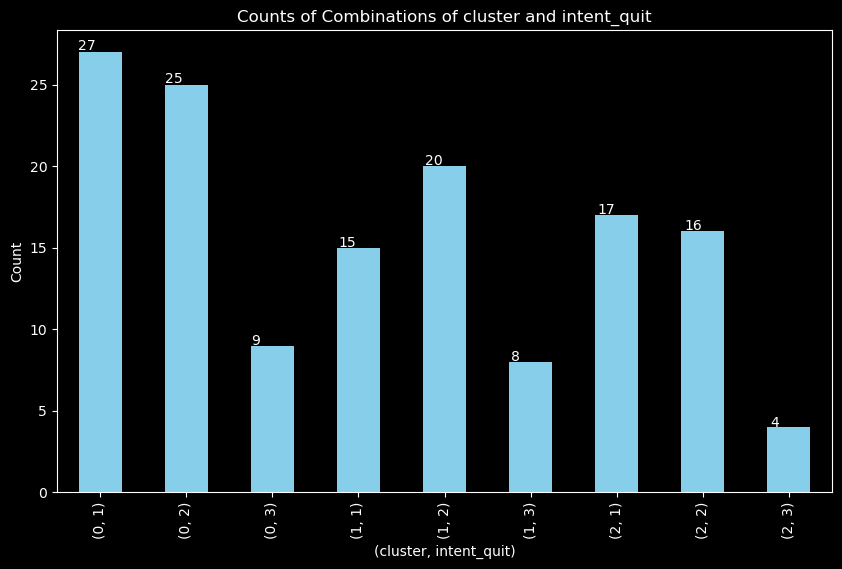

In [55]:
ax = combination_counts_intent.plot(kind='bar', figsize=(10, 6), color='skyblue')

# Add data labels to the bars
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

plt.title('Counts of Combinations of cluster and intent_quit')
plt.xlabel('(cluster, intent_quit)')
plt.ylabel('Count')
plt.show()

The above plot represents the distribution of `intent_quit` groupings amongst the clusters. This suggests that the clusters are not formed by grouping together employees with similar intentions. 

Let's take a look at the combinations for `sentiment` and `cluster`:

In [56]:
# Compute the number of members in each cluster that come from each of the 'sentiment' groups:

combination_counts_sentiment = results2.groupby(['cluster', 'sentiment']).size()

# Print the counts of each combination
print("Counts of combinations of 'cluster' and 'sentiment':")
print(combination_counts_sentiment)

# 1 = positive (expect to have the highest average overall satisfaction)
# 2 = negative (expect to have the lowest average overall satisfaction)
# 3 = neutral

Counts of combinations of 'cluster' and 'sentiment':
cluster  sentiment
0        1            16
         2            35
         3            10
1        1            11
         2            17
         3            15
2        1            10
         2            20
         3             7
dtype: int64


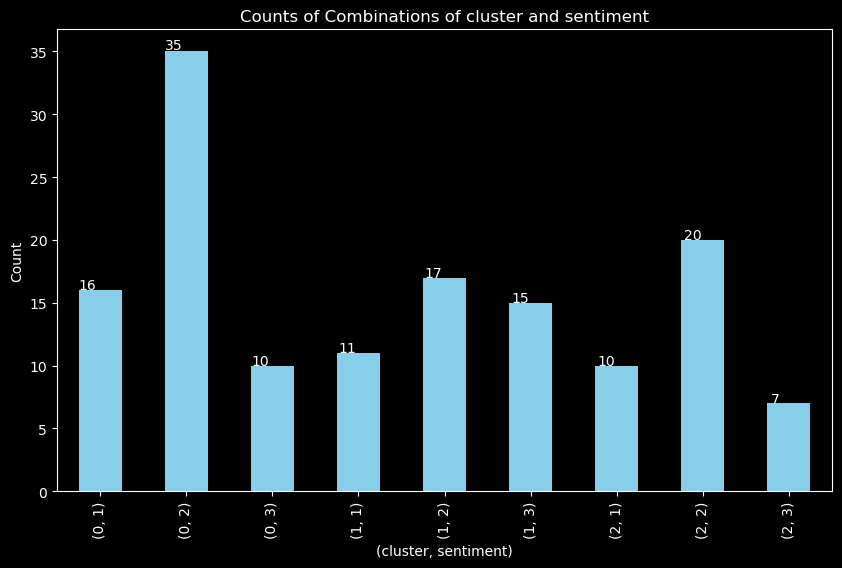

In [57]:
# Visual representation of the above data
ax1 = combination_counts_sentiment.plot(kind='bar', figsize=(10, 6), color='skyblue')

# Add data labels to the bars
for p in ax1.patches:
    ax1.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))
    
plt.title('Counts of Combinations of cluster and sentiment')
plt.xlabel('(cluster, sentiment)')
plt.ylabel('Count')
plt.show()

Again, we see that each cluster consists of respondents from each sentiment category:
* positive
* negative
* neutral

This suggests that the clusters are not formed by grouping employees based on sentiment. NOTE: the sentiment scores provided were derived by the P&C team reading each comment and assigning it a positive, negative or neutral score. This method may need to be reviewed and the clustering analysis revisited if significantly different results are returned for the sentiment analysis.

# Findings

Clustering is a Machine Learning technique to group data based on similarities in the data set. Although clustering is mainly used on unlabelled data, labelled data can be used to confirm clsuters. The k-menas clustering algorithm is a very popular method as it is easy to interpret and understand. One disadvantage of clustering is that there is no metric to evaluate goodness of fit, as there is with classification and regression (supervised learning).

Here we were tasked with exploring k-means clustering to identify natural groups in the employee survey dataset. The dataset contained 142 survey responses, provided by the P&C team, with categorical demographic data encoded into numerical categories, standardised scores for the 10 key areas of focus for the P&C team and overall score as the sum of the 10 areas, and scores for cateogries `intention to quit` and `sentiment`.

The survey data was not scaled, as the data was presented in standardised form, meaning scores had the same units for each of the 10 key areas, from -5 to 5, and the spread of data was similar. The values from the 10 key areas, being continuous numerical values, were used to build the k-means clustering algorithm, with goodness of fit sought by examining the clustering based on overall score.

The elbow and silhouette methods were employed to determine the k-value before the fit of the k-means clustering algorithm. The visualisation of the elbow method, and calculation of the elbow point using `KneeLocator`, indicated `k=5`, while the silhouetter method indicated `k=2, 3, 4` or `5`. All the k-values were used and evaluated using `overall_score` to deetermine the goodness of fit.

All explored k-values produced soft clusters with overlapping. With `k=3` the clusters appeared to adequately capture the variation in satisfaction levels among employees. However, I was unable to determine the origin of these groupings to understand how the clusters had been formed.

<hr style="border: 0; border-top: 1px solid #333333; margin: 20px 0;">


# Classification Decision Tree

### identify the data features most likely to affect `intent_quit`

### 1) import the data

We will continue on with the dataset prepared above in k-means clustering, DataFrame `results2`

In [58]:
results2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 141 entries, 1 to 141
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   workloc        141 non-null    int64  
 1   workleng       141 non-null    int64  
 2   manag_resp     141 non-null    int64  
 3   involved       141 non-null    float64
 4   autonomy       141 non-null    float64
 5   direct_manag   141 non-null    float64
 6   integrated     141 non-null    float64
 7   welfare        141 non-null    float64
 8   training       141 non-null    float64
 9   work_press     141 non-null    float64
 10  reflexive      141 non-null    float64
 11  innovative     141 non-null    float64
 12  customers      141 non-null    float64
 13  overall_score  141 non-null    float64
 14  intent_quit    141 non-null    int64  
 15  sentiment      141 non-null    int64  
 16  cluster        141 non-null    int32  
dtypes: float64(11), int32(1), int64(5)
memory usage: 18.3 

A quick summary of the dataset before we proceed.
* There are 141 records, representing employee survey responses. 
* 1 outlier has been removed from the original dataset containing 142 records.
* There are no missing values.
* There are no dulpicate records.
* Categorical responses have already been encoded to numerical values.
* Column names make sense according to the descriptions provided in the metadata.

### 2) Set the variables

We need to set the `X` and `y` variables for the decision tree model. Based on the scenario, the `X` variable will consist of all the labels (columns) except the `target` (`intent_quit`), and `overall_score` as this is the result of the 10 key focus areas. Note: I ran the model including `overall_score` and I prefer to leave it out, slightly increasing the accuracy of the model. I have left the model run out of the analysis to keep it concise.

In [59]:
# set the variables

X = results2.drop(columns=['overall_score', 'intent_quit'], axis=1)
y = results2['intent_quit']

> There is no output message, indicating that Python is happy with the code snippet.

### 3) Split the data

We'll use the `train_test_split` module from `sklearn` to split the data into random train and test subsets.

In [60]:
# split the data set

# Import train_test_split.
from sklearn.model_selection import train_test_split

# Split the data into training and test sets. Set test size to 20%, creating an 80:20 split (train:test)
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.2,
                                                    random_state=42)

> There is no output message, indicating that Python is happy with the code snippet.

### 4) Specify and fit the model

We need to specify the decision tree model. Therefore, we'll use the `DecisionTreeClassifier` class from the `sklearn.tree` library. This will help us build our Classification Decision Tree. There are a number of ways that decisions are made at each of the nodes, based on impurity or information gain. In this investigation we will be using the Gini index to make the best decisions at each node on how to split the data. The split that results in the lowest Gini index is selected as the best split for partitioning the data. We need to specify the parameter `criterion = 'gini'` in the model.

In [61]:
# specify the model

# Import DecisionTreeClassifier.
from sklearn.tree import DecisionTreeClassifier

# Create a decision tree classifier.
clf = DecisionTreeClassifier(criterion='gini')

# Train the classifier.
clf.fit(X_train, y_train)

DecisionTreeClassifier()

> The output `DecisionTreeClassifier` signifies that a decision tree model has been successfully generated using the values of `X` and `y`.

Next, we'll determine the predicted values of `y` based on the `X_test` data set with the `predict()` method.

In [62]:
# Predict on the test data set.
y_pred = clf.predict(X_test)

# View output.
y_pred

array([1, 1, 3, 2, 1, 1, 2, 1, 2, 1, 1, 2, 2, 1, 1, 3, 2, 1, 3, 1, 2, 1,
       2, 2, 2, 3, 3, 1, 1], dtype=int64)

> An array was returned, indicating that the predicted values were generated. 
> Next, we can visualise the decision tree model.

## 5) Visualise the model

### a) Textual tree

In [63]:
# Import tree and export_text.
from sklearn import tree
from sklearn.tree import export_text

# Create the text tree.
text_representation = tree.export_text(clf)

# View the text tree.
print(text_representation)

|--- feature_13 <= 1.50
|   |--- class: 2
|--- feature_13 >  1.50
|   |--- feature_13 <= 2.50
|   |   |--- feature_11 <= -2.44
|   |   |   |--- class: 3
|   |   |--- feature_11 >  -2.44
|   |   |   |--- feature_9 <= 0.16
|   |   |   |   |--- feature_12 <= -0.73
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_12 >  -0.73
|   |   |   |   |   |--- feature_6 <= -0.46
|   |   |   |   |   |   |--- feature_6 <= -1.10
|   |   |   |   |   |   |   |--- feature_1 <= 10.50
|   |   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |   |   |--- feature_1 >  10.50
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- feature_6 >  -1.10
|   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |--- feature_6 >  -0.46
|   |   |   |   |   |   |--- feature_7 <= 0.82
|   |   |   |   |   |   |   |--- feature_3 <= -1.02
|   |   |   |   |   |   |   |   |--- class: 2
|   |   |   |   |   |   |   |--- feature_3 >  -1.02
|   |   |   |   |   |   |   |   |--- feature

> The textual tree looks similar to a file directory. This image is not very informative. Let's create a decision tree visualisation with Matplotlib

### b) Matplotlib tree

We need to specify the class names. As the aim is to determine 'intention to quit', and we have from the metadata:
* 1 = intention to quit
* 2 = intention to stay
* 3 = not sure

we will set `class_names=['Intention to Quit', 'Intention to Stay', 'Not Sure']`

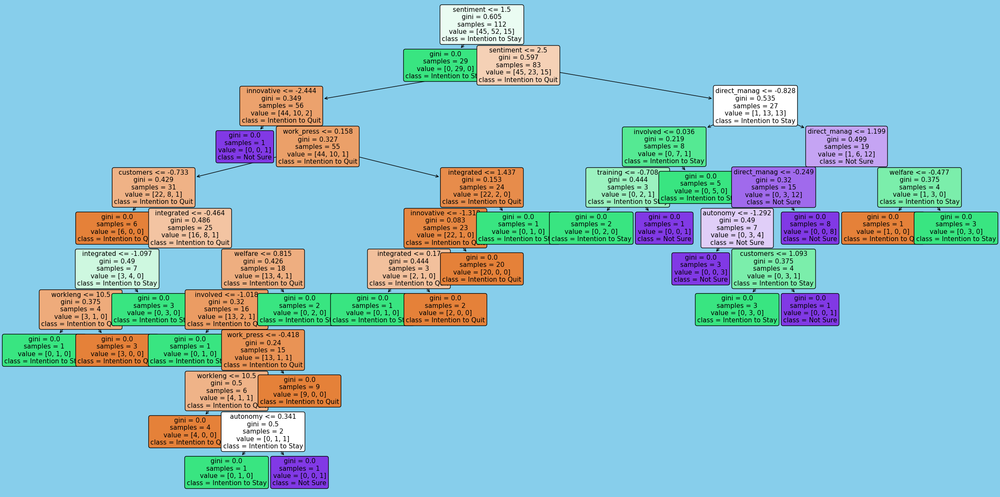

In [71]:
import matplotlib.pyplot as plt
from sklearn import tree

# Set the style back to default. Dark background does not present the tree nicely.
plt.style.use('default')

# Plot the tree.
plt.figure(figsize=(30, 15), facecolor='skyblue')
tree.plot_tree(clf,
               feature_names=list(X.columns),
               class_names=['Intention to Quit', 'Intention to Stay', 'Not Sure'],
               filled=True,
               rounded=True,
              fontsize=11,
             )

# View the plot.
plt.show()

We have visualised our decision tree model. I was unable to use Graphviz on my computer to improve the visualisation. Let's see if we can interpret and understand our decision tree.

We start at the `root node`, this is the first decision that is taken, at the top of the decision tree. The model does this by creating many shallow trees with just the root node and two leafs (no more splits). Every variable in the X variable is a candidate to be the root node. The model creates shallow trees for every variable and calculates the Gini Impurity for each possible tree. The Gini Impurity of each split is the weighted average  Gini Impurity for the child nodes. The tree with the lowest Gini Impurity is the winner and the splitting continues down through the child nodes until either a specified depth is reached or there are no more splits.

In the tree above, we see that the `sentiment` is the feature chosen at the root node. The dataset is divided into two subsets, partitioning the data based on the value of the sentiment score. If the sentiment score is less than 1.5 (sentiment is either 1 (positive), 2 (negative), or 3 (neutral)) the model follows the left branch, the data is labelled with class name `Intention to Stay`, which makes sense given the sentiment is positive. This is a leaf node with Gini Impurity of 0, which is a pure node where all samples belong to the same class, so no further splitting along this branch. The other child node of the root node is made up of the data with sentiment scores of 2 and 3. With Gini Impurity 0.597, there is another decision to be made regarding splitting.

Following the logic of the root node, all possible splits are tested to determine the split with the lowest Gini Impurity. And again, `sentiment` is chosen as the feature for splitting. As we have not specified maximum depth of the decision tree we see that the model has worked its way through each decision node until all leaf nodes are pure.

## 6) Evaluate the accuracy of the model

The accuracy of the model is evaluated by comparing its predictions to the actual values in the testing data set. We will use the methods `accuracy score`, `confusion matrix`, and `classification report` from the `sklearn.metrics` library to evaluate the model.

In [72]:
# Evaluate the accuracy of the model
# Import accuracy_score.
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Predict the accuracy score.
y_pred = clf.predict(X_test)

# Print the accuracy.
print("\nTrain data accuracy:",
      accuracy_score(y_true = y_train,
                     y_pred=clf.predict(X_train)))

print("\nTest data accuracy:",
      accuracy_score(y_true = y_test,
                     y_pred=y_pred))

print("\nConfusion Matrix:",
      confusion_matrix(y_test, y_pred))

print("\nClassification Report:\n",
      classification_report(y_test, y_pred))


Train data accuracy: 1.0

Test data accuracy: 0.7931034482758621

Confusion Matrix: [[12  1  1]
 [ 0  8  1]
 [ 2  1  3]]

Classification Report:
               precision    recall  f1-score   support

           1       0.86      0.86      0.86        14
           2       0.80      0.89      0.84         9
           3       0.60      0.50      0.55         6

    accuracy                           0.79        29
   macro avg       0.75      0.75      0.75        29
weighted avg       0.79      0.79      0.79        29



From the output we can deduce an accuracy of approximately 79%, indicating that the trained model correctly predicted about 79% of the labels in the test data..

The confusion matrix provides a summary of the predictions made by the model compared to the actual labels in the test data. As there are three classes a 3x3 matrix has been produced. It is easier to interpret the confusion matrix when it is presented visually.

The classification report indicates an accuracy of 0.79 with 29 predictions.

### Visualise the confusion matrix

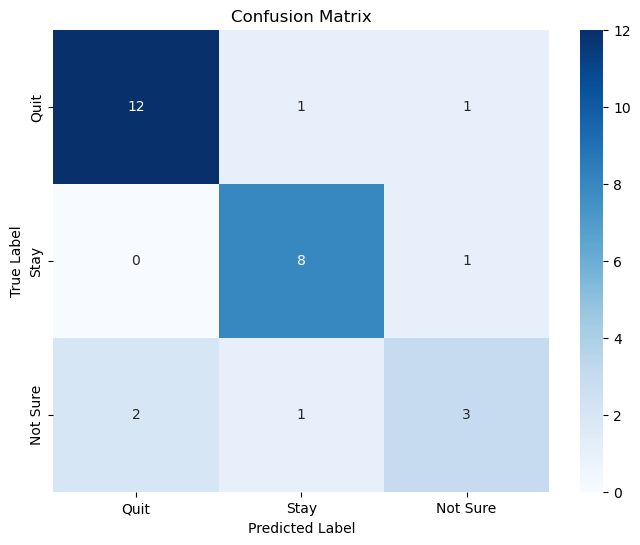

In [73]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Quit', 'Stay', 'Not Sure'], yticklabels=['Quit', 'Stay', 'Not Sure'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


The confusion matrix indicates that 12 instances were correctly classified as intending to quit, eight were correctly classified as intending to stay, and three were correctly classified as not sure. These are the true positives for each of the classes. 

The model incorrectly labelled two that intend to quit as either intending to stay (1) or not sure (1).[False Positives - Type 1 Errors]

The model incorrectly labelled one that intends to stay as not sure [False Negative - Type 2 Error], and incorrectly labelled three that were not sure as intending to quit (2) and intending to stay (1).

### Improve the accuracy of the model - pruning

Let's see if we can improve the accuracy of the model by pruning the decision tree. Decision trees work to minimise Gini Impurity. One of the disadvantages of this is that the model overfits the training data and loses accuracy for the test set. We will prune the tree by setting the maximum depth of the tree, and then evaluate to see if the accuracy metrics improve.

### Depth = 3

In [74]:
# Prune the tree.
clf_pruned = DecisionTreeClassifier(criterion='gini',
                                    max_depth=3,
                                    min_samples_split=2,
                                    min_samples_leaf=1,
                                    min_weight_fraction_leaf=0.0,
                                    max_features=None,
                                    random_state=0, 
                                    max_leaf_nodes=None,
                                    min_impurity_decrease=0.0, 
                                    class_weight=None,
                                    ccp_alpha=0.0)

# Fit the model.
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3, random_state=0)

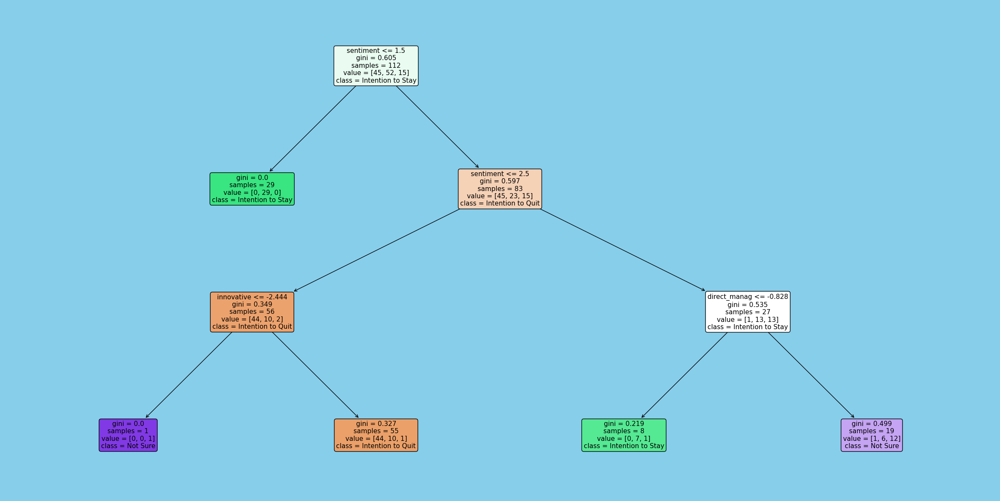

In [75]:
# Plot the tree.
plt.figure(figsize=(30, 15), facecolor='skyblue')
tree.plot_tree(clf_pruned,
               feature_names=list(X.columns),
               class_names=['Intention to Quit', 'Intention to Stay', 'Not Sure'],
               filled=True,
               rounded=True,
              fontsize=11,
             )

# View the plot.
plt.show()

In [76]:
# Predict on the test set.
y_pred_pruned = clf_pruned.predict(X_test)

# View the output.
y_pred_pruned

array([1, 1, 3, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 2, 1, 3, 1, 2, 1,
       2, 3, 2, 3, 3, 1, 1], dtype=int64)

In [77]:
# Evaluate the accuracy of the pruned model.
print("Accuracy (Pruned):",
      accuracy_score(y_test, y_pred_pruned))

print("\nConfusion Matrix (Pruned):\n",
      confusion_matrix(y_test, y_pred_pruned))

print("\nClassification Report (Pruned):\n",
      classification_report(y_test, y_pred_pruned))

Accuracy (Pruned): 0.896551724137931

Confusion Matrix (Pruned):
 [[14  0  0]
 [ 0  8  1]
 [ 2  0  4]]

Classification Report (Pruned):
               precision    recall  f1-score   support

           1       0.88      1.00      0.93        14
           2       1.00      0.89      0.94         9
           3       0.80      0.67      0.73         6

    accuracy                           0.90        29
   macro avg       0.89      0.85      0.87        29
weighted avg       0.90      0.90      0.89        29



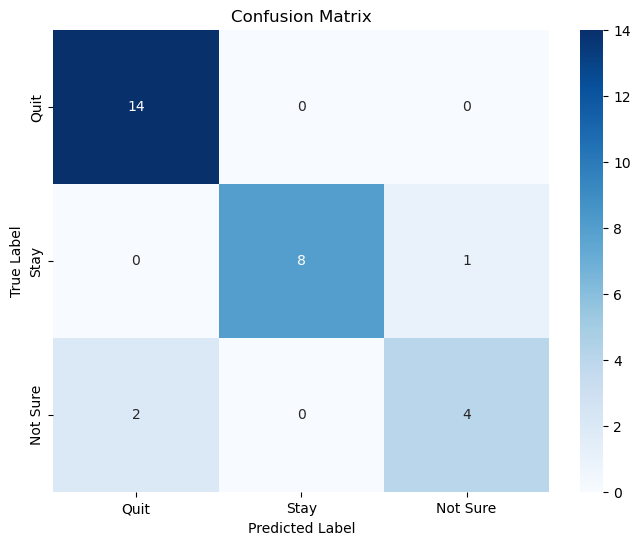

In [78]:
# Calculate confusion matrix
cmp = confusion_matrix(y_test, y_pred_pruned)

# Plot confusion matrix as a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(cmp, annot=True, fmt='d', cmap='Blues', xticklabels=['Quit', 'Stay', 'Not Sure'], yticklabels=['Quit', 'Stay', 'Not Sure'])
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

We see that the accuracy has improved to approximately 90% with 29 predictions. Only 3 predictions were incorrect as seen in the confusion matrix above. Precision and recall have improved suggesting that the model's ability to make accurate predictions and correctly identify classes has improved. Precision is the ration of true positive predictions to the total number of positive predictions made by the model. Recall is the ratio of true positive predictions to the total number of actual positive instances in the dataset. Precision focuses on the accuracy of positive predictions, while recall focuses on the ability of the model to correctly identify positive instances.

### Depth =4

In [79]:
# Prune the tree.
clf_pruned_4 = DecisionTreeClassifier(criterion='gini',
                                    max_depth=4,
                                    min_samples_split=2,
                                    min_samples_leaf=1,
                                    min_weight_fraction_leaf=0.0,
                                    max_features=None,
                                    random_state=0, 
                                    max_leaf_nodes=None,
                                    min_impurity_decrease=0.0, 
                                    class_weight=None,
                                    ccp_alpha=0.0)

# Fit the model.
clf_pruned_4.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=4, random_state=0)

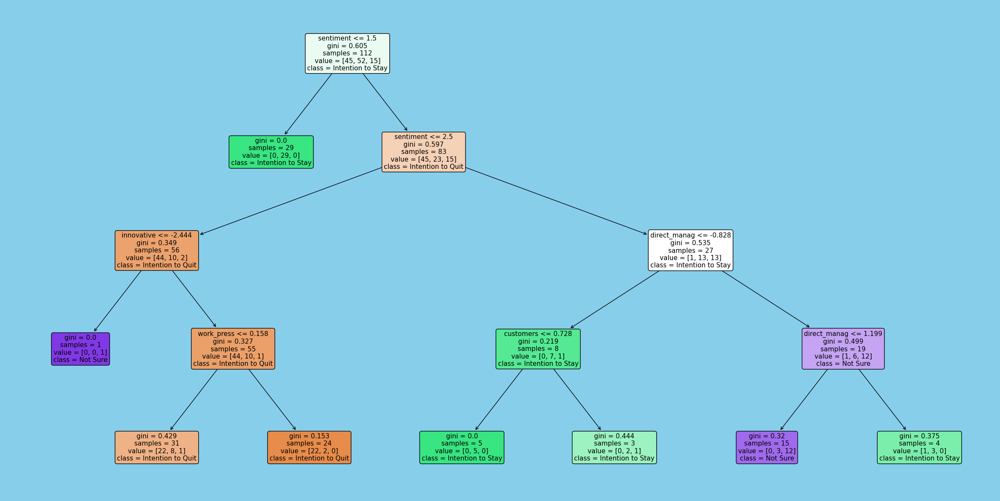

In [80]:
# Plot the tree.
plt.figure(figsize=(30, 15), facecolor='skyblue')
tree.plot_tree(clf_pruned_4,
               feature_names=list(X.columns),
               class_names=['Intention to Quit', 'Intention to Stay', 'Not Sure'],
               filled=True,
               rounded=True,
              fontsize=11,
             )

# View the plot.
plt.show()

In [81]:
# Predict on the test set.
y_pred_pruned_4 = clf_pruned_4.predict(X_test)

# View the output.
y_pred_pruned_4

array([1, 1, 3, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 2, 1, 3, 1, 2, 1,
       2, 2, 2, 3, 3, 1, 1], dtype=int64)

In [82]:
# Evaluate the accuracy of the pruned model.
print("Accuracy (Pruned):",
      accuracy_score(y_test, y_pred_pruned_4))

print("\nConfusion Matrix (Pruned):\n",
      confusion_matrix(y_test, y_pred_pruned_4))

print("\nClassification Report (Pruned):\n",
      classification_report(y_test, y_pred_pruned_4))

Accuracy (Pruned): 0.8620689655172413

Confusion Matrix (Pruned):
 [[14  0  0]
 [ 0  8  1]
 [ 2  1  3]]

Classification Report (Pruned):
               precision    recall  f1-score   support

           1       0.88      1.00      0.93        14
           2       0.89      0.89      0.89         9
           3       0.75      0.50      0.60         6

    accuracy                           0.86        29
   macro avg       0.84      0.80      0.81        29
weighted avg       0.85      0.86      0.85        29



The accuracy of the model has decreased to 86% on 29 predictions, with only 1 extra layer to the tree.

### Depth = 5

In [85]:
# Prune the tree.
clf_pruned_5 = DecisionTreeClassifier(criterion='gini',
                                    max_depth=5,
                                    min_samples_split=2,
                                    min_samples_leaf=1,
                                    min_weight_fraction_leaf=0.0,
                                    max_features=None,
                                    random_state=0, 
                                    max_leaf_nodes=None,
                                    min_impurity_decrease=0.0, 
                                    class_weight=None,
                                    ccp_alpha=0.0)

# Fit the model.
clf_pruned_5.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=5, random_state=0)

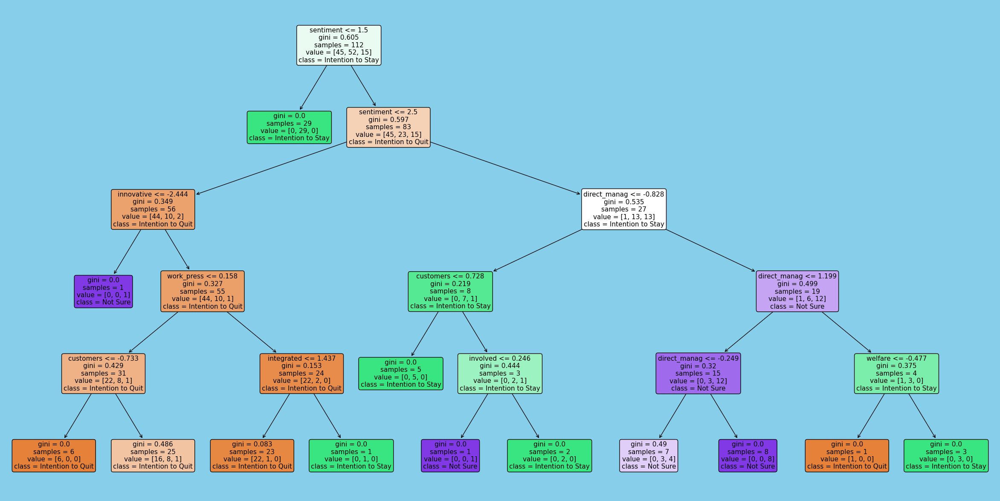

In [86]:
# Plot the tree.
plt.figure(figsize=(30, 15), facecolor='skyblue')
tree.plot_tree(clf_pruned_5,
               feature_names=list(X.columns),
               class_names=['Intention to Quit', 'Intention to Stay', 'Not Sure'],
               filled=True,
               rounded=True,
              fontsize=11,
             )

# View the plot.
plt.show()

In [88]:
# Predict on the test set.
y_pred_pruned_5 = clf_pruned_5.predict(X_test)

# View the output.
y_pred_pruned_5

array([1, 1, 3, 2, 1, 1, 1, 1, 2, 1, 1, 2, 2, 1, 1, 1, 2, 1, 3, 1, 2, 1,
       2, 2, 2, 3, 3, 1, 1], dtype=int64)

In [89]:
# Evaluate the accuracy of the pruned model.
print("Accuracy (Pruned):",
      accuracy_score(y_test, y_pred_pruned_5))

print("\nConfusion Matrix (Pruned):\n",
      confusion_matrix(y_test, y_pred_pruned_5))

print("\nClassification Report (Pruned):\n",
      classification_report(y_test, y_pred_pruned_5))

Accuracy (Pruned): 0.8620689655172413

Confusion Matrix (Pruned):
 [[14  0  0]
 [ 0  8  1]
 [ 2  1  3]]

Classification Report (Pruned):
               precision    recall  f1-score   support

           1       0.88      1.00      0.93        14
           2       0.89      0.89      0.89         9
           3       0.75      0.50      0.60         6

    accuracy                           0.86        29
   macro avg       0.84      0.80      0.81        29
weighted avg       0.85      0.86      0.85        29



The accuracy of the model with max depth set to 5 is 86% on 29 predictions.

## Findings

Classification Decision Trees are a Machine Learning technique used to classify data into different classes or categories. Decision trees are easy to interpret, understand, and explain. DTs are able to handle both categorical and numerical data, as we witnessed in our model. A Classification Decision Tree model was built on a training data set and evaluated on a test data set of 29 records. DTs are prone to overfitting. We investigated 'pruning' the decision tree as a solution to overfitting and witnessed an increase in prediction accuracy with the pruned tree to a maximum depth of three.

The sentiment score was identified as the feature for the root node, suggesting that sentiment has the highest impact on the classification of labels to predict intention to quit, intention to stay, or not sure. Sentiment was followed by the focus areas of the survey `innovative` (and subsequently `work_press`) along what appeared to be the 'intention to quit' branch, and `direct_manag` along the 'intention to stay / not sure' branch. This suggests that the features most important to consider regarding employees intending to quit are:
* Whether employees perceive that the organisation welcomes ideas for innovation and implements these ideas (`innovative`)
* Whether there is a good work-life balance (`work_press`)

Evaluation of the Classification Decision Tree model was completed using metrics accuracy, precision and recall. The accuracy of the model was 79% with no maximum depth, increasing to 90% with a depth of three, decreasing to 86% at depths of four and five.

The largest source of error demonstrated by the confusion matrix occurred for the instances labelled 'not sure'. Sentiment scores were determined by reading the comments and assigning a sentiment score:
* 1 = positive
* 2 = negative
* 3 = neutral
> Depending on the rules used to assign scores, some of the scores may be different under a different system. It might be worth revisiting this analysis once a review of the sentiment analysis has been completed.

<hr style="border: 0; border-top: 1px solid #333333; margin: 20px 0;">

# Sentiment Analysis

### derive further insights into how employees feel about the organisation

The method we’ll use is sentiment analysis – a natural language processing (NLP) task that determines the emotional meaning behind textual data (TechTarget 2021). NLP uses algorithms and statistical models to analyse, understand, and generate human language for data insights. 

Analysing employee sentiment can also have a significant impact on a business's success. Employee sentiment analysis provides insights into the attitudes, perceptions, and emotions of employees towards their work, colleagues, and the organisation as a whole. By analysing employee feedback, companies can identify patterns and trends that may affect employee satisfaction and engagement. This information can then be used to improve company culture, to identify areas for improvement, and ultimately to increase employee retention and productivity. 

## Import the data

In [90]:
# Import necessary libraries.
import numpy as np
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

# Import the data set.
comments = pd.read_csv('employee_comments.csv')

# View the data.
print(comments.shape)
comments.head(20)

(142, 2)


,ID,What led to how you feel about working at ServiceFirst? Please type into the box below. Describe an event at work and how it affected your thoughts and feelings.
0,1,No Comment
1,2,A close colleague recently experienced some is...
2,3,ServiceFirst is understaffed in areas and over...
3,4,When I started at ServiceFirst the customer re...
4,5,NaN
5,7,No comment
6,8,No comment
7,9,ServiceFirst could be the best service provide...
8,10,i feel that whilst the work load has vastly in...
9,12,"Some of the questions required a ""not sure"" op..."


We have a DataFrame with two columns and 142 rows. There are no unnecessary columns to drop in this case. However, the column name for the respondent comments is very long, we will reduce it to `comments`. Other than that there are two items to note before we explore further.
- There are 142 rows, coinciding with the 142 employees that gave permission for their anonymous responses to be used for research, and;
- There are a number of respondents that have entered 'no comment' or have actually not left a comment, denoted by NaN. In this case it will make sense to count the number of respondents that have not commented.

Let's change the column name first to make the DataFrame easier to work with.

## Change column names

In [2]:
comments.columns
# This will make it easier to copy and paste the column name for renaming!

Index(['ID', 'What led to how you feel about working at ServiceFirst? Please type into the box below. Describe an event at work and how it affected your thoughts and feelings.'], dtype='object')

In [91]:
comments.rename(columns={'What led to how you feel about working at ServiceFirst? Please type into the box below. Describe an event at work and how it affected your thoughts and feelings.':'comments'}, inplace = True)

# view to ensure changes are made
comments.head()

,ID,comments
0,1,No Comment
1,2,A close colleague recently experienced some is...
2,3,ServiceFirst is understaffed in areas and over...
3,4,When I started at ServiceFirst the customer re...
4,5,NaN


## Determine and remove missing values

In [5]:
comments.isnull().sum()

ID          0
comments    2
dtype: int64

In [93]:
responses = comments.dropna()

responses.shape

(140, 2)

> There were two rows with no entries for the response. These two records have been removed, saved as a new DataFrame `responses`.

# Pre-process the data

## Change all of the words in the `comments` to lower case

In [94]:
# Transform data to lowercase.
responses['comments'] = responses['comments'].apply(lambda x: " ".join(x.lower() for x in x.split()))
'''this code snippet takes each comment in the "comments" column, converts it to lowercase, splits it into individual words,
and then joins these words back together into a single string with spaces between them.'''

# Preview the result.
responses['comments'].head()

0                                           no comment
1    a close colleague recently experienced some is...
2    servicefirst is understaffed in areas and over...
3    when i started at servicefirst the customer re...
5                                           no comment
Name: comments, dtype: object

## Remove punctuation

In [95]:
responses['comments'] = responses['comments'].str.replace(r'[^\w\s]', '')
'''this code snippet removes any non-alphanumeric characters from each comment in the "comments" column, 
leaving only alphanumeric characters and whitespace'''

# Preview the result.
responses['comments'].head()

0                                           no comment
1    a close colleague recently experienced some is...
2    servicefirst is understaffed in areas and over...
3    when i started at servicefirst the customer re...
5                                           no comment
Name: comments, dtype: object

In [10]:
# check the responses, see if there are any differences between the "no comment" responses.
responses['comments'].value_counts()

comments
no comment                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

It appears that some punctuation has not been removed from the records, as we can see that we have 27 records for `no comment` and two records for `no comment.`

Let's consider another way of removing punctuation:

In [97]:
import re

# Function to remove punctuation from a single string
def remove_punctuation(text):
    # Regular expression to match punctuation
    punctuation_pattern = r'[^\w\s]'
    # Replace punctuation with an empty string
    return re.sub(punctuation_pattern, '', text)

# Apply the function to all strings in the DataFrame
responses['comments'] = responses['comments'].apply(remove_punctuation)

# Display the DataFrame after removing punctuation
print(responses)

      ID                                           comments
0      1                                         no comment
1      2  a close colleague recently experienced some is...
2      3  servicefirst is understaffed in areas and over...
3      4  when i started at servicefirst the customer re...
5      7                                         no comment
..   ...                                                ...
137  189  the job is becoming increasingly more difficul...
138  190                                         no comment
139  192  targets circumstances which are totally out of...
140  193                                         no comment
141  194  certain events have occurred where action shou...

[140 rows x 2 columns]


In [98]:
# check again
responses['comments'].value_counts()

comments
no comment                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

That looks much better, we can see that 30 respondents have decided to respond with 'no comment. In addition to the two that left no comment at all, in total we will remove 32 records from the DataFrame, leaving 110 records to conduct the sentiment analysis.

Let's go ahead and remove the records containing the string 'no comment'.

In [100]:
# Filter out records containing 'no comment'
responses = responses[~responses['comments'].str.contains('no comment', case=False)]

# Display the DataFrame after filtering
print(responses)

      ID                                           comments
1      2  a close colleague recently experienced some is...
2      3  servicefirst is understaffed in areas and over...
3      4  when i started at servicefirst the customer re...
7      9  servicefirst could be the best service provide...
8     10  i feel that whilst the work load has vastly in...
..   ...                                                ...
135  186  main events i worked hard to get exceeding req...
136  188  ive only been here 3 months  im enjoying it ve...
137  189  the job is becoming increasingly more difficul...
139  192  targets circumstances which are totally out of...
141  194  certain events have occurred where action shou...

[110 rows x 2 columns]


Let's check to make sure that there are no duplicate responses in the comments column.

## Check for duplicate records and remove any from the DataFrame

In [101]:
responses.comments.duplicated().sum()

1

There is one duplicated record in the `comments` column. Let's check to see what it is:

In [102]:
# Filter the DataFrame to show the duplicate record(s)
duplicate_records = responses[responses.comments.duplicated()]

# Display the duplicate record(s)
print(duplicate_records)

    ID                                           comments
61  80  very passionate staff affected by the recessio...


Let's go ahead and drop the duplicate record from the DataFrame, at index 60.

In [103]:
# Drop duplicates.
answers = responses.drop_duplicates(subset=['comments'])

# Reset the index.
answers.reset_index(inplace=True)

# Preview the data.
print(answers.shape)
answers.head()

(109, 3)


,index,ID,comments
0,1,2,a close colleague recently experienced some is...
1,2,3,servicefirst is understaffed in areas and over...
2,3,4,when i started at servicefirst the customer re...
3,7,9,servicefirst could be the best service provide...
4,8,10,i feel that whilst the work load has vastly in...


We now have a DataFrame with 109 unique responses to the survey question regarding employment with ServiceFirst.

## Visualise the most frequently used words with a WordCloud

In [104]:
# String all the comments together in a single variable.
# Create an empty string variable.
all_comments = ''
for i in range(answers.shape[0]):
    # Add each comment.
    all_comments = all_comments + answers['comments'][i]

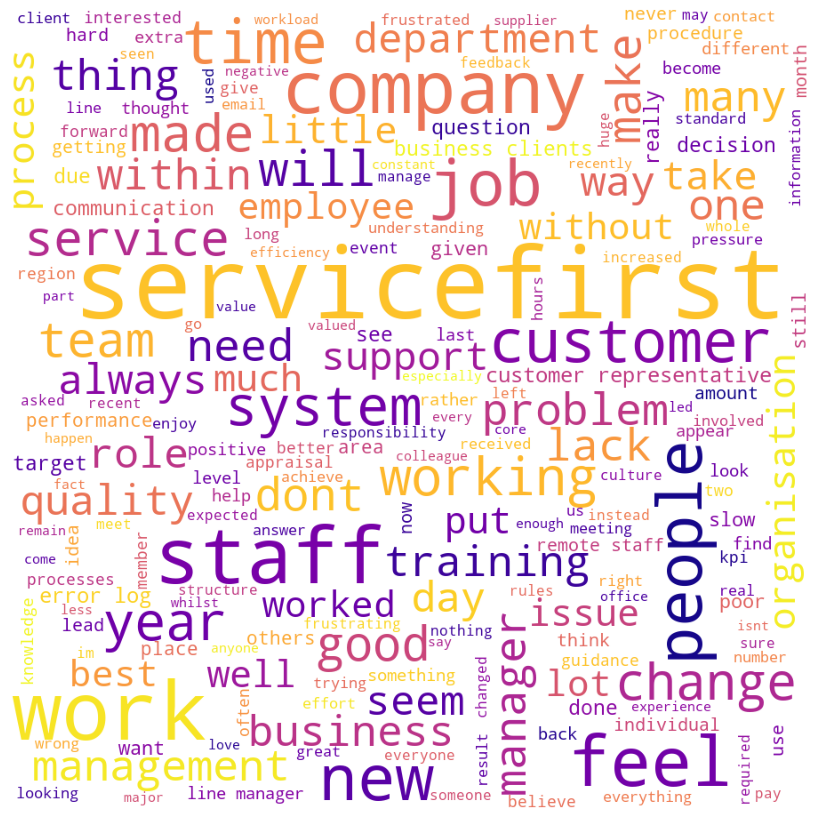

<Figure size 640x480 with 0 Axes>

In [105]:
# Import along with Matplotlib and Seaborn for visualisation.
from wordcloud import WordCloud 
import matplotlib.pyplot as plt 
import seaborn as sns

# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object. (Leave out the stopwords such as to, a , the, I, are, and, & am.)
word_cloud = WordCloud(width = 900,
                       height = 900,
                       background_color ='white',
                       colormap = 'plasma', 
                       # stopwords = 'none',
                       min_font_size = 10).generate(all_comments) 

# Plot the WordCloud image.                    
plt.figure(figsize = (8, 8),
           facecolor = None) 

plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

plt.savefig('survey_wordcloud_1.png')

There appears to be a mix of words that seem positive and negative here. It can be hard to get an overall feel for the responses, however there are obvious negative words that appear in larger font, such as 'lack', 'issue', 'dont' and 'problem'.

## Find the most frequently used words with tokenisation

In [106]:
# Import nltk and download nltk's resources to assist with tokenisation.
import nltk

nltk.download('punkt')
from nltk.tokenize import word_tokenize

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\adamt\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [107]:
# Tokenise the words.
answers['tokens'] = answers['comments'].apply(word_tokenize)

# Preview data.
print(answers.shape)
answers['tokens'].head()

(109, 4)


0    [a, close, colleague, recently, experienced, s...
1    [servicefirst, is, understaffed, in, areas, an...
2    [when, i, started, at, servicefirst, the, cust...
3    [servicefirst, could, be, the, best, service, ...
4    [i, feel, that, whilst, the, work, load, has, ...
Name: tokens, dtype: object

In [108]:
# Define an empty list of tokens.
all_tokens = []

for i in range(answers.shape[0]):
    # Add each token to the list.
    all_tokens = all_tokens + answers['tokens'][i]

In [109]:
# Import the FreqDist class.
from nltk.probability import FreqDist

# Calculate the frequency distribution.
fdist = FreqDist(all_tokens)

# Preview data.
fdist

FreqDist({'the': 561, 'to': 436, 'and': 394, 'of': 296, 'i': 240, 'a': 236, 'in': 198, 'is': 177, 'are': 155, 'have': 141, ...})

In [110]:
# Filter out tokens that are neither alphabets nor numbers (to eliminate punctuation marks, etc.).
tokens1 = [word for word in all_tokens if word.isalnum()]

# View the output.
tokens1

['a',
 'close',
 'colleague',
 'recently',
 'experienced',
 'some',
 'issues',
 'outside',
 'of',
 'work',
 'which',
 'impacted',
 'slightly',
 'on',
 'their',
 'role',
 'line',
 'management',
 'and',
 'senior',
 'management',
 'showed',
 'great',
 'care',
 'and',
 'diplomacy',
 'in',
 'handling',
 'the',
 'issue',
 'which',
 'made',
 'me',
 'feel',
 'confident',
 'that',
 'employees',
 'are',
 'valued',
 'as',
 'people',
 'as',
 'well',
 'as',
 'staff',
 'servicefirst',
 'is',
 'understaffed',
 'in',
 'areas',
 'and',
 'over',
 'staffed',
 'in',
 'others',
 'communication',
 'is',
 'a',
 'one',
 'way',
 'process',
 'whereby',
 'if',
 'staff',
 'do',
 'not',
 'do',
 'as',
 'asked',
 'by',
 'line',
 'managers',
 'then',
 'its',
 'a',
 'problem',
 'but',
 'if',
 'line',
 'managers',
 'dont',
 'answer',
 'to',
 'problems',
 'identified',
 'via',
 'email',
 'then',
 'its',
 'no',
 'problem',
 'the',
 'seems',
 'to',
 'be',
 'a',
 'ostrich',
 'mentality',
 'of',
 'sticking',
 'heads',
 'in'

## Eliminate stopwords

In [111]:
# Download the stop word list.
nltk.download ('stopwords')
from nltk.corpus import stopwords

# Create a set of English stop words.
english_stopwords = set(stopwords.words('english'))

# Create a filtered list of tokens without stop words.
tokens2 = [x for x in tokens1 if x.lower() not in english_stopwords]

# Define an empty string variable.
tokens2_string = ''

for value in tokens2:
    # Add each filtered token word to the string.
    tokens2_string = tokens2_string + value + ' '
    
# View the output.
tokens2

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\adamt\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


['close',
 'colleague',
 'recently',
 'experienced',
 'issues',
 'outside',
 'work',
 'impacted',
 'slightly',
 'role',
 'line',
 'management',
 'senior',
 'management',
 'showed',
 'great',
 'care',
 'diplomacy',
 'handling',
 'issue',
 'made',
 'feel',
 'confident',
 'employees',
 'valued',
 'people',
 'well',
 'staff',
 'servicefirst',
 'understaffed',
 'areas',
 'staffed',
 'others',
 'communication',
 'one',
 'way',
 'process',
 'whereby',
 'staff',
 'asked',
 'line',
 'managers',
 'problem',
 'line',
 'managers',
 'dont',
 'answer',
 'problems',
 'identified',
 'via',
 'email',
 'problem',
 'seems',
 'ostrich',
 'mentality',
 'sticking',
 'heads',
 'sand',
 'regional',
 'managers',
 'seem',
 'interested',
 'identifying',
 'problems',
 'rather',
 'resolving',
 'staff',
 'reluctant',
 'ask',
 'questions',
 'regional',
 'managers',
 'abused',
 'statements',
 'explained',
 'email',
 'months',
 'ago',
 'staff',
 'reluctant',
 'ask',
 'regional',
 'managers',
 'questions',
 'rather',
 

## Visualise the tokens of relevance in a wordcloud

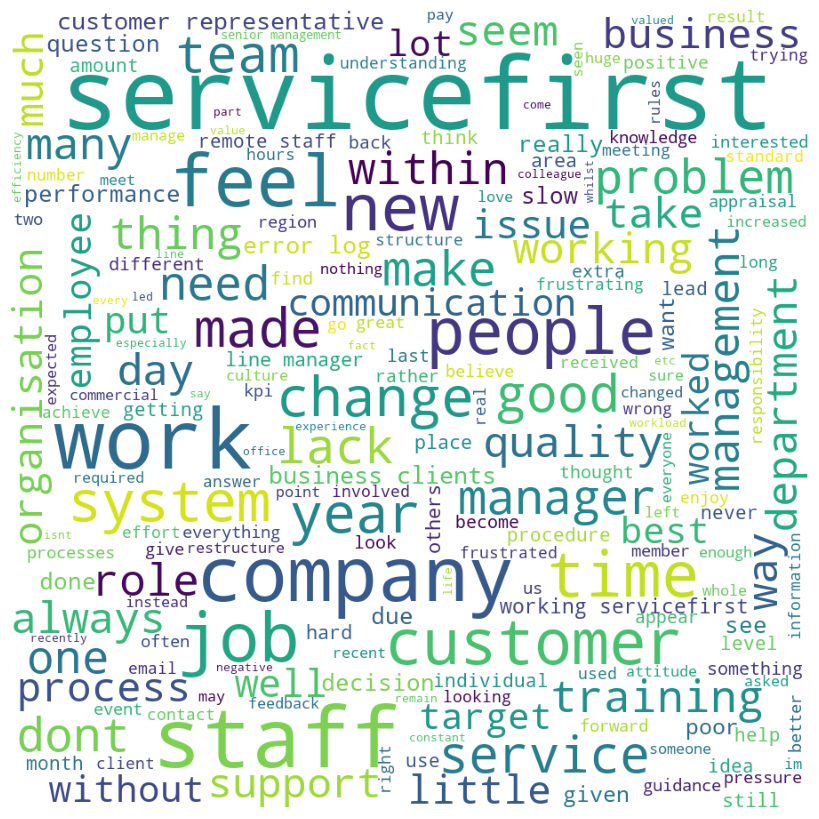

<Figure size 640x480 with 0 Axes>

In [112]:
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud.
wordcloud = WordCloud(width = 900,
                      height = 900, 
                      background_color ='white', 
                      # colormap='plasma', 
                      min_font_size = 10).generate(tokens2_string) 

# Plot the WordCloud image.                        
plt.figure(figsize = (8, 8),
           facecolor = None) 

plt.imshow(wordcloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()

# Save the wordcloud as a png file.
plt.savefig('survey_wordcloud_2.png')

## Frequency distribution of words

In [113]:
# View the frequency distribution.
fdist1 = FreqDist(tokens2)

# Preview the data.
fdist1

FreqDist({'servicefirst': 129, 'staff': 88, 'work': 77, 'company': 62, 'feel': 55, 'new': 47, 'people': 44, 'job': 44, 'time': 40, 'working': 39, ...})

In [114]:
# Import the Counter class.
from collections import Counter

# Generate a DataFrame from Counter.
counts = pd.DataFrame(Counter(tokens2).most_common(20),
                      columns=['Word', 'Frequency']).set_index('Word')

# Preview data.
counts

,Frequency
Word,
servicefirst,129
staff,88
work,77
company,62
feel,55
new,47
people,44
job,44
time,40


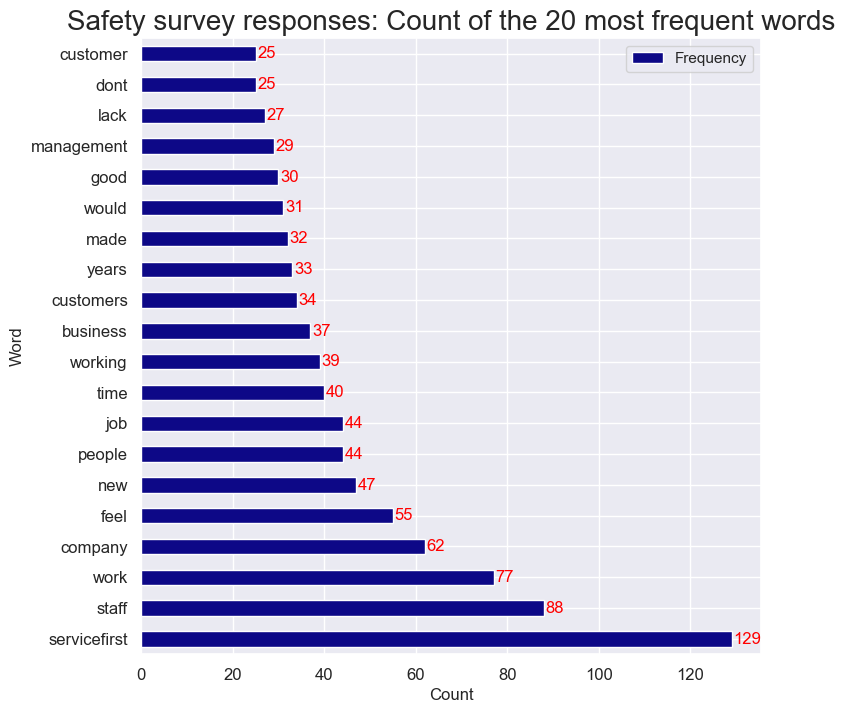

In [115]:
# Set the plot type.
ax = counts.plot(kind='barh',
                 figsize=(8, 8),
                 fontsize=12,
                 colormap ='plasma')

# Set the labels.
ax.set_xlabel('Count', fontsize=12)
ax.set_ylabel('Word', fontsize=12)
ax.set_title("Safety survey responses: Count of the 20 most frequent words",
             fontsize=20)

# Draw the bar labels.
for i in ax.patches:
    ax.text(i.get_width()+.41, i.get_y()+.1, str(round((i.get_width()), 2)),
            fontsize=12, color='red')
    
# Save the plot as a png file.
plt.savefig('frequent_words.png')

## Review polarity and sentiment

In [116]:
# Import the necessary package.
from textblob import TextBlob

In [117]:
# Define a function to extract a polarity score for the comment.
def generate_polarity(comment):
    return TextBlob(comment).sentiment[0]

# Populate a new column with polarity scores for each comment.
answers['polarity'] = answers['comments'].apply(generate_polarity)

# Preview the result.
answers['polarity'].head()

0    0.386667
1    0.093750
2    0.350000
3    1.000000
4    0.047143
Name: polarity, dtype: float64

In [118]:
# Define a function to extract a subjectivity score for the comment.
def generate_subjectivity(comment):
    return TextBlob(comment).sentiment[1]

# Populate a new column with subjectivity scores for each comment.
answers['subjectivity'] = answers['comments'].apply(generate_subjectivity)

# Preview the result.
answers['subjectivity'].head()

0    0.540000
1    0.433333
2    0.625000
3    0.300000
4    0.450357
Name: subjectivity, dtype: float64

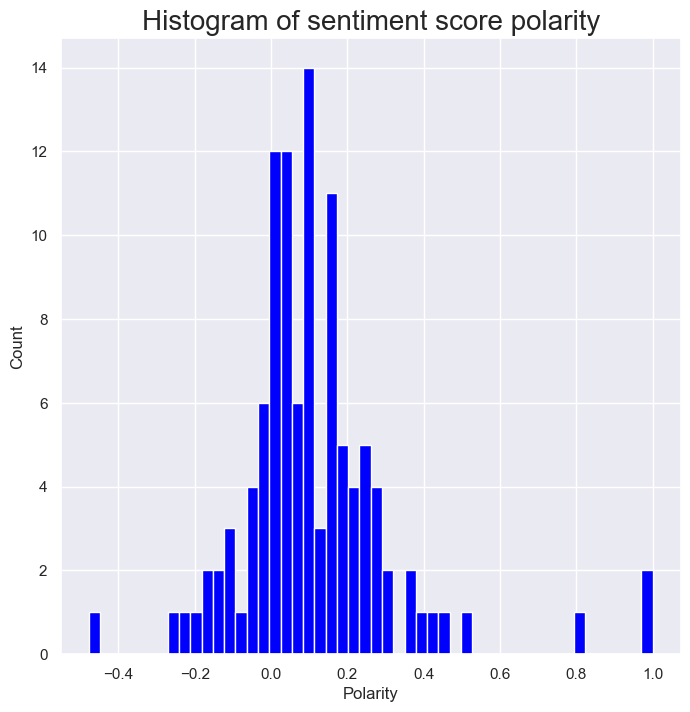

<Figure size 640x480 with 0 Axes>

In [119]:
# Set the number of bins.
num_bins = 50

# Set the plot area.
plt.figure(figsize=(8, 8))

# Define the bars.
n, bins, patches = plt.hist(answers['polarity'],
                            num_bins,
                            facecolor='blue')
                            
# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score polarity', fontsize=20)

plt.show()

# Save the plot as a png file.
plt.savefig('survey_polarity.png')

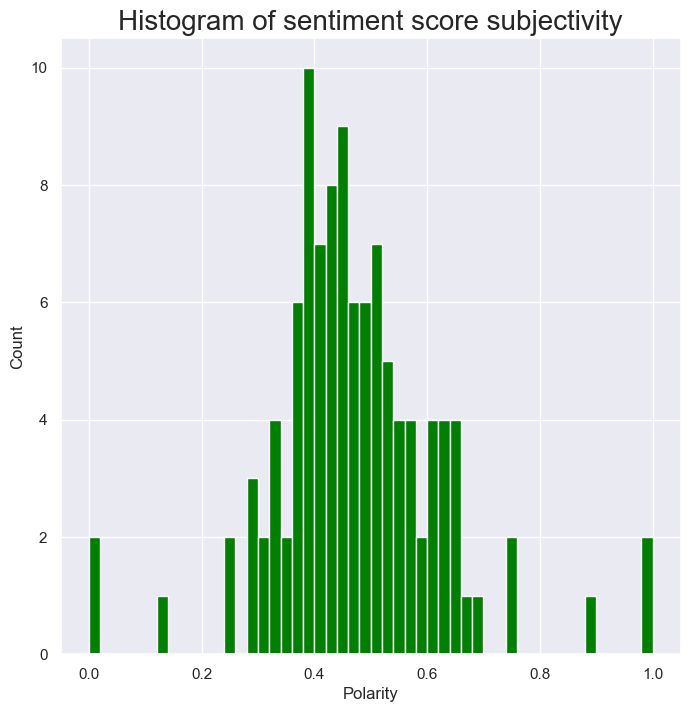

<Figure size 640x480 with 0 Axes>

In [120]:
# Set the number of bins.
num_bins = 50

# Set the plot area.
plt.figure(figsize=(8, 8))

# Define the bars.
n, bins, patches = plt.hist(answers['subjectivity'],
                            num_bins,
                            facecolor='green')
                            
# Set the labels.
plt.xlabel('Polarity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Histogram of sentiment score subjectivity', fontsize=20)

plt.show()

# Save the plot as a png file.
plt.savefig('survey_subjectivity.png')

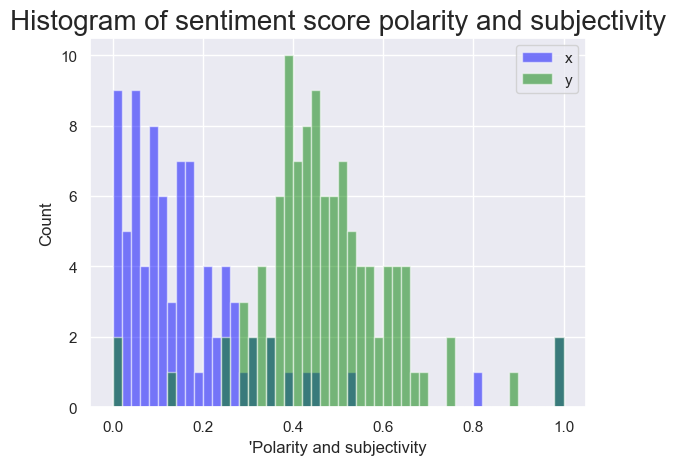

<Figure size 640x480 with 0 Axes>

In [121]:
# Combine the two histograms onto one plot for comparison.
x = answers['polarity']
y = answers['subjectivity']

# Specify histograms.
plt.hist(x,
         bins,
         color='blue',
         alpha=0.5,
         label='x')

plt.hist(y,
         bins,
         color='green',
         alpha=0.5,
         label='y')

# Set the labels.
plt.xlabel("'Polarity and subjectivity",
           fontsize=12)
plt.ylabel('Count',
           fontsize=12)
plt.title('Histogram of sentiment score polarity and subjectivity',
          fontsize=20)

plt.legend(loc='upper right')
plt.show()

# Save the plot as a png file.
plt.savefig('survey_polarity_and_subjectivity.png')

## Extract contextualised comments

### Positive polarity

In [122]:
# Create a DataFrame with top 20 positive comments.
positive_sentiment = answers.nlargest(20,
                                     'polarity')

# Eliminate unnecessary columns.
positive_sentiment = positive_sentiment[['comments',
                                         'polarity',
                                         'subjectivity']]

# Adjust the column width.
positive_sentiment.style.set_properties(subset=['comments'],
                                        **{'width': '2000px'})

# Save the output as a CSV file.
positive_sentiment.to_csv('survey_positive_sentiment.csv')

# View shape of DataFrame.
print(positive_sentiment.shape)
positive_sentiment.head(20)

(20, 3)


,comments,polarity,subjectivity
3,servicefirst could be the best service provide...,1.000000,0.300000
78,servicefirst is an excellent employer,1.000000,1.000000
85,the support and help i have received from ever...,0.800000,0.750000
41,the online process removes a very important po...,0.520000,1.000000
92,managers ofter manipulate situations to make t...,0.450000,0.575000
60,while things change instead of adapting servic...,0.422143,0.477143
0,a close colleague recently experienced some is...,0.386667,0.540000
10,on the whole i enjoy my job and i enjoy workin...,0.352963,0.600926
2,when i started at servicefirst the customer re...,0.350000,0.625000
105,ive only been here 3 months im enjoying it ve...,0.317778,0.695556


In [123]:
positive_sentiment.at[3, 'comments']

'servicefirst could be the best service provider in the country but are always reactive instead of proactive'

In [124]:
positive_sentiment.at[41, 'comments']

'the online process removes a very important point of contact that we had with clients when they would come in the system is now to anonymass'

In [125]:
positive_sentiment.at[92, 'comments']

'managers ofter manipulate situations to make themselves appear to be doing a good job senior management appear to allow themselves to be manipulated managers make decisions that pass the responsibility for the implementation of the decisions to others whilst maintaining the authority if things go well the credit is claimed but if things dont go so well others are responsible'

In [126]:
positive_sentiment.at[60, 'comments']

'while things change instead of adapting servicefirst or some people within it to try make things fit the servicefirst way we have issues which could be prevented by using existing guidance insetad of creating the servicefirst guidance whilst we have dedicated staff they are not given good leadership and cpd they are given a series of opinions which cannot be validated and therefore they become disillusioned we do not use all the available error log methods and therefore do not work to our vison  mission statement i also feel that some people are more interested in saying the right thing to the right people and apperaing to do a good job rather than actually doing a good job'

In [127]:
positive_sentiment.at[51, 'comments']

'some of the questions could of done with an unsure answer because some questions arent relevant to my work more communication from the managers above would be more helpful in the future'

In [128]:
positive_sentiment.at[18, 'comments']

'the manager changed the new manager makes changes that put more work on the service staff rather than the customer team the error log is completed on a form that is not really fit for purpose and results in the service staff writing pages of information about the error log the service staff now seems to do more writing than the customer team removal of the service team support role this role was introduced after feedback from an external report to ensure better service management this has now been reversed and the quality of the service management is being affected too many fingers in the pie'

In [129]:
positive_sentiment.at[30, 'comments']

'good organisation however little understanding regarding front line pressures'

In [130]:
positive_sentiment.at[64, 'comments']

'i used to love working for servicefirst everyone had a purpose and was very motivated wanting to do a great job some remote staff are excellent within their role of supporting customers but have difficulties in understanding the processes procedures and rules they must abide by this is understandable based on their background but makes others work harder and more stressful as there is no repercussion to consistently doing a bad job and purposely avoiding the rules many members of staff exceed expectations whilst others do what they feel is necessary for a days work our quality standards used to be the most important aspects of servicefirst and used to drive what we did this is no longer and everyone now has no firm direction or expectation of high quality unfortunately and it is with sadness that people have lost their enthusiasm and motivation and more than anything else are waiting for something positive to happen unfortunately different departments do work separately and are almost

Some of the positive labelled comments appear to be negative upon reading, containing complaints about the organisation. This suggests that sentiment analysis is a complex technique, difficult to be accurate.

### Negative polarity

In [131]:
# Create a DataFrame with top 20 negative comments.
negative_sentiment = answers.nsmallest(20,
                                      'polarity')

# Eliminate unnecessary columns.
negative_sentiment = negative_sentiment[['comments',
                                         'polarity',
                                         'subjectivity']]

# Eliminate unnecessary columns.
negative_sentiment.style.set_properties(subset=['comments'], 
                                        **{'width': '1500px'})

# Save the output as a CSV file.
negative_sentiment.to_csv('survey_negative_sentiment.csv')

# View shape of DataFrame.
print(negative_sentiment.shape)
negative_sentiment.head(20)

(20, 3)


,comments,polarity,subjectivity
59,i try to lead a team that works flexibly to me...,-0.477500,0.460000
5,some of the questions required a not sure option,-0.250000,0.888889
86,i feel that we are not given enough training o...,-0.240909,0.446970
14,having worked for servicefirst for over 14 yea...,-0.195000,0.495000
95,if an individual in the remote does something ...,-0.175000,0.425000
77,an entrenched aristocratic class system has un...,-0.154077,0.515751
94,the organisation needs to get back to basics t...,-0.150000,0.511429
39,the organisations apathy and value of quality ...,-0.135848,0.392082
19,communication within servicefirst from it is v...,-0.116836,0.532224
99,the servicefirst error log record is also ridi...,-0.114333,0.380500


In [132]:
negative_sentiment.at[59, 'comments']

'i try to lead a team that works flexibly to meet business clients needs and the changing environment we are working in however implementation of developments are slow there is little infrastructure support and a lack byin from all there is a culture of optout if staff dont want to do something this has led to a team that are disengaged and frustrated making change difficult i personally am frustrated that i cannot lead change'

In [133]:
negative_sentiment.at[86, 'comments']

'i feel that we are not given enough training or guidance when new things are put in place at servicefirst which leads to frustration staff in servicefirst are frustrated and dissaloutioned with things within the company we have got tools that are outdated and make the tasks we carry out take 3 times longer than they should'

In [134]:
negative_sentiment.at[39, 'comments']

'the organisations apathy and value of quality from the top down the lack of embedding of quality standards parameters and management of the quality processes for all qualification routes and new commercial activities and has resulted in a culture of bad practice on a daily basis i am having to deal with and address a variety issues when they are identified and feel completely frustrated as the majority of the problems are due to cutting corners which then impacts on the companys performance efficiency not getting things done right frist time increased costs to rectify the problem correctly and no management control in terms of addressing route cause of problem performance management of staff and training development of staff'

In [135]:
negative_sentiment.at[69, 'comments']

'my then line manager went to see one of my business clients without my knowledge to resolve an issue a way forward was agreed but this was not relayed to me this made me feel isolated and my opinion not valued it also meant that i was not in a position to monitor this sitation and help to progress it no further action was taken by my line manager which has now resulted in me having to deal direct with an irate client because servicefirst have not implemented the proposed solution creating an unnecessarily stressful situation for me'

In [136]:
negative_sentiment.at[55, 'comments']

'communication has been very poor in the last 4 to 5 years and as a result i feel less involved with the company and i do not understand some of the decisions taken i have no idea whether the company is successful or not i assume not as we have made a lot of people redundant the senior team are invisible and do not inspire confidence our it systems are not keeping pace with those of my colleagues in other organisations but the people i work with believe in what we are doing with service contracts and can see the value to customers so we soldier on'

### Assign a sentiment score to each comment

We'll use the VADER lexicon and `SentimentIntensityAnalyzer` to compute a sentiment score for each comment.

In [137]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import pandas as pd

# Download VADER lexicon (if not already downloaded)
nltk.download('vader_lexicon')

# Initialize VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()

# Conduct sentiment analysis on each comment
sentiments = []
for comment in answers['comments']:
    # Get sentiment scores
    sentiment_scores = sid.polarity_scores(comment)
    
    # Determine sentiment
    if sentiment_scores['compound'] > 0:
        sentiment = 'Positive'
    elif sentiment_scores['compound'] < 0:
        sentiment = 'Negative'
    else:
        sentiment = 'Neutral'
    
    # Append sentiment to the list
    sentiments.append(sentiment)

# Add sentiments to the DataFrame
answers['sentiment'] = sentiments

# Display the DataFrame with sentiment analysis results
print(answers)


     index   ID                                           comments  \
0        1    2  a close colleague recently experienced some is...   
1        2    3  servicefirst is understaffed in areas and over...   
2        3    4  when i started at servicefirst the customer re...   
3        7    9  servicefirst could be the best service provide...   
4        8   10  i feel that whilst the work load has vastly in...   
..     ...  ...                                                ...   
104    135  186  main events i worked hard to get exceeding req...   
105    136  188  ive only been here 3 months  im enjoying it ve...   
106    137  189  the job is becoming increasingly more difficul...   
107    139  192  targets circumstances which are totally out of...   
108    141  194  certain events have occurred where action shou...   

                                                tokens  polarity  \
0    [a, close, colleague, recently, experienced, s...  0.386667   
1    [servicefirst, is,

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\adamt\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [138]:
answers['sentiment'].value_counts()

sentiment
Positive    68
Negative    37
Neutral      4
Name: count, dtype: int64

Contrast this with the categorisation the P&C team presented in the file `employee_survey.csv`:

In [139]:
survey = pd.read_csv('employee_survey.csv')
survey.head()

,id,agree,workloc,workleng,manag_resp,involved,autonomy,direct_manag,integrated,welfare,training,work_press,reflexive,innovative,customers,overall_score,intent_quit,sentiment
0,1,Yes,2,3,2,3.195169,3.879956,1.343400,4.920832,2.623486,4.476097,3.903101,2.996662,-2.256064,2.736050,27.82,2,3
1,2,Yes,1,3,2,-1.017589,0.613432,1.053927,-0.147223,1.073410,-1.106388,-0.705966,2.004760,-1.880934,-1.645745,-1.76,2,1
2,8,Yes,1,3,2,1.510066,0.613432,-2.419751,0.486283,0.040025,-0.308890,1.598567,-1.466898,0.744976,2.370901,3.17,2,3
3,15,Yes,1,3,2,1.088790,-0.475410,-1.551332,-0.780730,-1.510051,-1.106388,-0.129833,-1.218922,1.120106,-0.550296,-5.11,2,1
4,20,Yes,2,3,2,-0.596313,-1.564251,-0.393439,-0.147223,0.040025,0.488608,-0.129833,0.268931,0.744976,-1.280595,-2.57,3,3


In [140]:
survey['sentiment'].value_counts()

sentiment
2    72
1    37
3    33
Name: count, dtype: int64

given:
* 1 = Positive = 37
* 2 = Negative = 72
* 3 = Neutral  = 33

I inspected the survey responses and gave my own rating, shown below:

In [142]:
inspect = pd.read_csv('employee_comments_for _exploration.csv')
inspect.head()

,ID,Rating,Comments
0,2,Positive,A close colleague recently experienced some is...
1,3,Negative,ServiceFirst is understaffed in areas and over...
2,4,Neutral,When I started at ServiceFirst the customer re...
3,9,Negative,ServiceFirst could be the best service provide...
4,10,Negative,i feel that whilst the work load has vastly in...


In [143]:
inspect['Rating'].value_counts()

Rating
Negative    74
Positive    18
Neutral     17
Name: count, dtype: int64

### Evaluate results

The results of the different methods of sentiment analysis can be summarised as:

| System | 1=Positive | 2=Negative | 3=Neutral |  Total  |
|--------|------------|------------|-----------|---------|
| VADER  |     68     |     37     |     4     |    109  |
|   P&C  |     37     |     72     |     33    |     142 |
| Adam   |     18     |     74     |     17    |    109  |

These results suggest variation in sentiment classification among different methods, indicating the importance of considering the specific and characteristics of each method when analysing sentiment in text data.
The sentiment analysis conducted in the above code, with scores assigned using the VADER library, assigned the most positive comments, considerably different to the results assigned by humans reading the comments and assigning sentiment. The P&C team and I have similar numbers of negative comments. It is unclear how the P&C team assigned values to the blank responses or the 'no comment' responses, with positive numbers mismatched. This has implications for the analysis conducted above building predictive models, where sentiment scores have been used to determine features of the models.

## Findings

The employee_comments.csv file was loaded and inspected to derive further insights into how employees feel about the organisation, using sentiment analysis.

A brief overview of the dataset:
* The dataset contained 2 columns and 142 rows.
* The column name representing the column name was changed for ease of use.
* Two records were missing, 30 had 'no comment' entered, and one record was duplicated.
* 33 records were removed from the dataset prior to conducting sentiment analysis.

Text preprocessing techniques were applied, such as converting text to lowercase and removing punctuation, to prepare the comments for sentiment analysis.

The most frequent words were calculated and presented in word clouds and frequency graphs. The most frequent word used was ServiceFirst.

Subjectivity and polarity scores were calculated for each of the comments to indicate sentiment. The top 20 positive and negative sentiments were presented. Upon reading some of the positive labelled comments it appeared that there were complaints about the organisation. This suggests that the model used to calculate sentiment may over simplify the task.

A sentiment score was calculated for each comment using the VADER lexicon and `SentimentIntensityAnalyzer`, identifying 68 positive comments, 37 negative comments, and 4 neutral comments. According to the sentiment analysis the comments are predominantly positive.

This was contrasted with the sentiment scores provided by the P&C team, assigned after reading through the comments, where it was determined that 37 were positive, 72 were negative, and 33 neutral, with no account given for how null values and 'no comment' were assigned, and a duplicate record.

In the end, I decided to read through the comments, assigning 18 positive scores, 74 negative scores, and 17 neutral comments. The number of negative scores similar to that of the P&C team, with a difference of 33 records that the P&C team have not identified in their classification.

It appears that the sentiment analysis technique used in this project is limited in its ability to detect negative sentiment, with potential bias towards positive sentiment perhaps. Improvements may be provided through the use of other sentiment analysis tools and libraries. Further research is required to determine suitable alternatives to the tools used here.

The insights I gleaned from the comments line up with the analysis from the various models investigated, summarised as follows:
* Training, identified as the lowest scoring focus area in the exploratory analysis in Assignment 1, is not provided adequately or in a timely manner, often after an employee has struggled through and learnt the necessary tools and information on their own.
* Innovative, identified as a feature on the 'intention to quit' branch of the decision tree, featured in the comments, with a number of employees commenting that their ideas are not listened to. 
* Mentioned together were `involved`, `welfare`, and `work_press` in the form of comments about restructures leading to increased workloads that have impacted on employee well-being.
* The overarching theme, however, was that communication throughout the organisation has deteriorated over the past 4 to 5 years, leading employees to feel alienated and perceive that the organisation has no direction.
* The silver lining is that an new CEO was recently appointed and there is hope that things will change for the better and ServiceFirst can live up to its potential as an employer of choice.